## Steps considered for the project


#### Step 1: Data Preparation
1.	Load the Data: Read the stock data and S&P 500 index data.
2.	Inspect the Data: Check for any missing values or inconsistencies and handle them appropriately.
3.	Preprocess the Data: Normalize or standardize the data if necessary.
#### Step 2: Exploratory Data Analysis (EDA)
1.	Summary Statistics: Calculate and visualize summary statistics for each stock.
2.	Visualizations: Create visualizations to understand trends and patterns in the stock prices and volumes.
o	Line plots of stock prices over time.
o	Candlestick charts for detailed price movements.
o	Volume traded over time.
#### Step 3: Technical Analysis
1.	Moving Averages: Calculate simple and exponential moving averages.
2.	Relative Strength Index (RSI): Calculate the RSI to understand momentum.
3.	Moving Average Convergence Divergence (MACD): Calculate MACD for trend analysis.
4.	Bollinger Bands: Calculate Bollinger Bands to understand volatility.
#### Step 4: Risk and Return Metrics
1.	Daily Returns: Calculate daily returns for each stock.
2.	Annualized Return and Volatility: Calculate annualized return and volatility.
3.	Sharpe Ratio: Calculate the Sharpe Ratio for risk-adjusted return.
#### Step 5: Compare Against S&P 500
1.	Benchmark Comparison: Compare the performance of each stock against the S&P 500 index.
o	Calculate the beta of each stock relative to the S&P 500.
o	Plot the stock returns against the S&P 500 returns.
#### Step 6: Stock Selection
1.	Investment Criteria: Based on the risk and return metrics, select stocks that align with the conservative investment profile of Alexandra.
2.	CAPM Validation: Validate the selected stocks using the Capital Asset Pricing Model (CAPM).
#### Step 7: Predictive Modeling
1.	Model Selection: Choose a predictive model (e.g., ARIMA, LSTM) to estimate future returns.
2.	Model Training: Train the model on historical data.
3.	Prediction: Predict the returns for the investment period.
#### Step 8: Portfolio Construction and Validation
1.	Portfolio Optimization: Construct an optimal portfolio using techniques like Mean-Variance Optimization.
2.	Backtesting: Backtest the portfolio to check its performance over the historical period.
3.	Validation: Validate if the portfolio meets Alexandra's financial goals.



-----------------

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import mplfinance as mpf
import matplotlib.dates as mdates
from datetime import datetime
import scipy.optimize as sco
from statsmodels.tsa.arima.model import ARIMA
import os
import warnings
warnings.filterwarnings('ignore')


---------------


#### Step 1: Data Preparation
1.	Load the Data: Read the stock data and S&P 500 index data.
2.	Inspect the Data: Check for any missing values or inconsistencies and handle them appropriately.
3.	Preprocess the Data: Normalize or standardize the data if necessary.

In [2]:


# List of stock files
stock_files = [
    "AAL.csv", "ALK.csv", "HA.csv", "CS.csv", "DB.csv",
    "GS.csv", "JNJ.csv", "MRK.csv", "BHC.csv", "AAPL.csv",
    "AMZN.csv", "GOOG.csv", "S&P500.csv"
]

# Load data into the stocks dictionary
stocks = {}
for file in stock_files:
    stock_name = file.split('.')[0]
    df = pd.read_csv(file)
    stocks[stock_name] = df

# Create a directory to save the cleaned data
output_dir = "cleaned_stock_data"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def clean_data(df, stock_name):
    # Check for missing values and drop rows with missing 'Date'
    df = df.dropna(subset=['Date'])
    
    # Convert 'Date' to datetime with the correct format
    try:
        df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
    except ValueError:
        df['Date'] = pd.to_datetime(df['Date'], format='%m-%d-%Y')
    
    # Fill missing values for other columns if necessary (e.g., forward fill)
    df = df.fillna(method='ffill')
    
    # Normalize column names
    df.columns = [col.strip() for col in df.columns]
    
    # Save the cleaned DataFrame
    df.to_csv(os.path.join(output_dir, f'{stock_name}_cleaned.csv'), index=False)
    
    return df

# Apply cleaning to all stocks
cleaned_stocks = {}
for stock_name, df in stocks.items():
    cleaned_stocks[stock_name] = clean_data(df, stock_name)

# Identify the common dates across all stocks
common_dates = set(cleaned_stocks["S&P500"]['Date'])
for stock_name, df in cleaned_stocks.items():
    common_dates = common_dates.intersection(set(df['Date']))

# Convert the common_dates set to a sorted list
common_dates = sorted(list(common_dates))

# Filter each DataFrame to include only the common dates
for stock_name, df in cleaned_stocks.items():
    df = df[df['Date'].isin(common_dates)]
    cleaned_stocks[stock_name] = df.reset_index(drop=True)

# Save the final cleaned and synchronized data
for stock_name, df in cleaned_stocks.items():
    df.to_csv(os.path.join(output_dir, f'{stock_name}_final.csv'), index=False)

# Priniting cleaned and synchronized data
for stock_name, df in cleaned_stocks.items():
    print(f"{stock_name}:")
    print(df.info())
    print(df.head())

AAL:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2517 non-null   datetime64[ns]
 1   Open       2517 non-null   float64       
 2   High       2517 non-null   float64       
 3   Low        2517 non-null   float64       
 4   Close      2517 non-null   float64       
 5   Adj Close  2517 non-null   float64       
 6   Volume     2517 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 137.8 KB
None
        Date  Open  High   Low  Close  Adj Close   Volume
0 2010-10-01  9.29  9.39  9.21   9.29   8.758067  3603800
1 2010-10-04  9.24  9.48  9.05   9.12   8.597802  3856800
2 2010-10-05  9.27  9.35  9.15   9.23   8.701504  3896600
3 2010-10-06  9.27  9.40  9.15   9.23   8.701504  3230200
4 2010-10-07  9.30  9.31  9.07   9.24   8.710930  3877700
ALK:
<class 'pandas.core.frame.DataFrame'>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2517 non-null   datetime64[ns]
 1   Open       2517 non-null   float64       
 2   High       2517 non-null   float64       
 3   Low        2517 non-null   float64       
 4   Close      2517 non-null   float64       
 5   Adj Close  2517 non-null   float64       
 6   Volume     2517 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 137.8 KB
None
        Date        Open        High         Low       Close   Adj Close  \
0 2010-10-01  157.080002  157.440002  152.199997  153.710007  153.710007   
1 2010-10-04  153.949997  155.960007  152.789993  155.389999  155.389999   
2 2010-10-05  157.080002  161.210007  157.009995  160.869995  160.869995   
3 2010-10-06  160.600006  160.679993  154.600006  155.399994  155.399994   
4 2010-10-07  156.509995 

---------------


#### Step 2: Exploratory Data Analysis (EDA)
1.	Summary Statistics: Calculate and visualize summary statistics for each stock.
2.	Visualizations: Create visualizations to understand trends and patterns in the stock prices and volumes.

   o	Line plots of stock prices over time.
   
   o	Candlestick charts for detailed price movements.
   
   o	Volume traded over time.

In [2]:
# Load all cleaned stock data including S&P 500
stock_files = ["AAL_final.csv", "ALK_final.csv", "HA_final.csv", "CS_final.csv", "DB_final.csv", "GS_final.csv", 
               "JNJ_final.csv", "MRK_final.csv", "BHC_final.csv", "AAPL_final.csv", "AMZN_final.csv", "GOOG_final.csv", "S&P500_final.csv"]

stocks = {}

for file in stock_files:
    stock_name = file.split('.')[0]
    df = pd.read_csv(file)
    stocks[stock_name] = df

# Print the shape and summary info of each DataFrame
for stock_name, df in stocks.items():
    print(f"{stock_name}:")
    print(df.shape)
    print(df.info())
    print("\n")


AAL_final:
(2517, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2517 non-null   object 
 1   Open       2517 non-null   float64
 2   High       2517 non-null   float64
 3   Low        2517 non-null   float64
 4   Close      2517 non-null   float64
 5   Adj Close  2517 non-null   float64
 6   Volume     2517 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 137.8+ KB
None


ALK_final:
(2517, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2517 non-null   object 
 1   Open       2517 non-null   float64
 2   High       2517 non-null   float64
 3   Low        2517 non-null   float64
 4   Close      2517 non-null   float64
 5   Adj Close  2517 non-null   flo

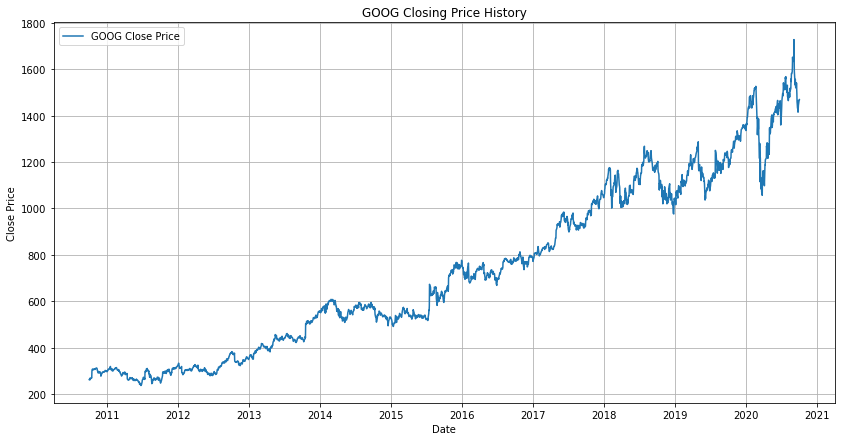

In [3]:
# Example for GOOG
goog = stocks['GOOG_final']

# Convert 'Date' to datetime if not already
goog['Date'] = pd.to_datetime(goog['Date'], infer_datetime_format=True)

# Plot the closing price history
plt.figure(figsize=(14, 7))
plt.plot(goog['Date'].values, goog['Close'].values, label='GOOG Close Price')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('GOOG Closing Price History')
plt.legend()

# Format the x-axis to show only the year
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())

plt.grid(True)
plt.show()

In [4]:
# Create a directory to save the plots
output_dir = "stock_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_closing_prices(stock_name, df):
    # Convert 'Date' to datetime if not already
    df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)
    
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'].values, df['Close'].values, label=f'{stock_name} Close Price')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'Closing Price History for {stock_name}')
    plt.legend()
    
    # Format the x-axis to show only the year
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    
    plt.grid(True)
    plt.tight_layout()
    
    # Save the plot as an image file
    plt.savefig(os.path.join(output_dir, f'{stock_name}_closing_price.png'))
    plt.close()  # Close the plot to free memory



# Plot closing prices for each stock
for stock_name, df in stocks.items():
    plot_closing_prices(stock_name, df)

In [5]:
# Create a directory to save the plots
output_dir = "stock_candlestick_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_candlestick_chart(df, stock_name):
    # Check the format of the 'Date' column
    sample_date = df['Date'].iloc[0]
    try:
        # Try parsing the date using infer_datetime_format
        df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)
    except ValueError:
        # If infer_datetime_format fails, try manual parsing
        date_format = "%Y-%m-%d" if '-' in sample_date else "%Y/%m/%d"
        df['Date'] = pd.to_datetime(df['Date'], format=date_format)
    
    # Set 'Date' as the index
    df.set_index('Date', inplace=True)
    
    # Ensure required columns are in place
    if not {'Open', 'High', 'Low', 'Close', 'Volume'}.issubset(df.columns):
        raise ValueError(f"Missing required columns in {stock_name} DataFrame")
    
    # Plot candlestick chart
    mpf.plot(df, type='candle', style='charles', title=f'{stock_name} Candlestick Chart', ylabel='Price', savefig=os.path.join(output_dir, f'{stock_name}_candlestick_chart.png'))
    
    # Reset index for further operations
    df.reset_index(inplace=True)

# Plot candlestick charts for each stock
for stock_name, df in stocks.items():
    plot_candlestick_chart(df, stock_name)

In [6]:
# Create a directory to save the volume plots
volume_output_dir = "stock_volume_plots"
if not os.path.exists(volume_output_dir):
    os.makedirs(volume_output_dir)

def plot_volume_traded(stock_name, df):
    # Ensure 'Date' column is in datetime format
    df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)
    
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'].values, df['Volume'].values, label=f'{stock_name} Volume Traded')
    plt.xlabel('Date')
    plt.ylabel('Volume Traded')
    plt.title(f'Volume Traded History for {stock_name}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    # Save the plot as an image file
    plt.savefig(os.path.join(volume_output_dir, f'{stock_name}_volume_traded.png'))
    plt.close()  # Close the plot to free memory

# Plot volume traded for each stock
for stock_name, df in stocks.items():
    plot_volume_traded(stock_name, df)



---------------


#### Step 3: Technical Analysis
1.	Moving Averages: Calculate simple and exponential moving averages.
2.	Relative Strength Index (RSI): Calculate the RSI to understand momentum.
3.	Moving Average Convergence Divergence (MACD): Calculate MACD for trend analysis.
4.	Bollinger Bands: Calculate Bollinger Bands to understand volatility.

In [7]:
def calculate_technical_indicators(df):
    # Convert 'Date' to datetime if not already
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

    # Calculate Moving Averages
    df['SMA_20'] = df['Close'].rolling(window=20).mean()
    df['EMA_20'] = df['Close'].ewm(span=20, adjust=False).mean()

    # Calculate RSI
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).fillna(0)
    loss = (-delta.where(delta < 0, 0)).fillna(0)
    avg_gain = gain.rolling(window=14).mean()
    avg_loss = loss.rolling(window=14).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # Calculate MACD
    df['MACD'] = df['Close'].ewm(span=12, adjust=False).mean() - df['Close'].ewm(span=26, adjust=False).mean()
    df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()

    # Calculate Bollinger Bands
    df['Middle_Band'] = df['Close'].rolling(window=20).mean()
    df['Upper_Band'] = df['Middle_Band'] + 2 * df['Close'].rolling(window=20).std()
    df['Lower_Band'] = df['Middle_Band'] - 2 * df['Close'].rolling(window=20).std()

    df.reset_index(inplace=True)
    return df

# Apply the calculations to each stock
for stock_name, df in stocks.items():
    stocks[stock_name] = calculate_technical_indicators(df)

# Example of how to access the data
print(stocks['AAPL_final'].head())

        Date       Open       High        Low      Close  Adj Close  \
0 2010-10-01  10.219643  10.235000  10.048214  10.090000   8.719163   
1 2010-10-04  10.057143  10.103572   9.920357   9.951428   8.599421   
2 2010-10-05  10.071428  10.337500  10.065000  10.319285   8.917298   
3 2010-10-06  10.342500  10.428214  10.187857  10.328215   8.925013   
4 2010-10-07  10.369286  10.374286  10.246786  10.329286   8.925941   

      Volume  SMA_20     EMA_20  RSI      MACD  Signal_Line  Middle_Band  \
0  448142800     NaN  10.090000  NaN  0.000000     0.000000          NaN   
1  435302000     NaN  10.076803  NaN -0.011054    -0.002211          NaN   
2  501967200     NaN  10.099896  NaN  0.009756     0.000182          NaN   
3  670868800     NaN  10.121641  NaN  0.026661     0.005478          NaN   
4  408399600     NaN  10.141417  NaN  0.039688     0.012320          NaN   

   Upper_Band  Lower_Band  
0         NaN         NaN  
1         NaN         NaN  
2         NaN         NaN  
3   

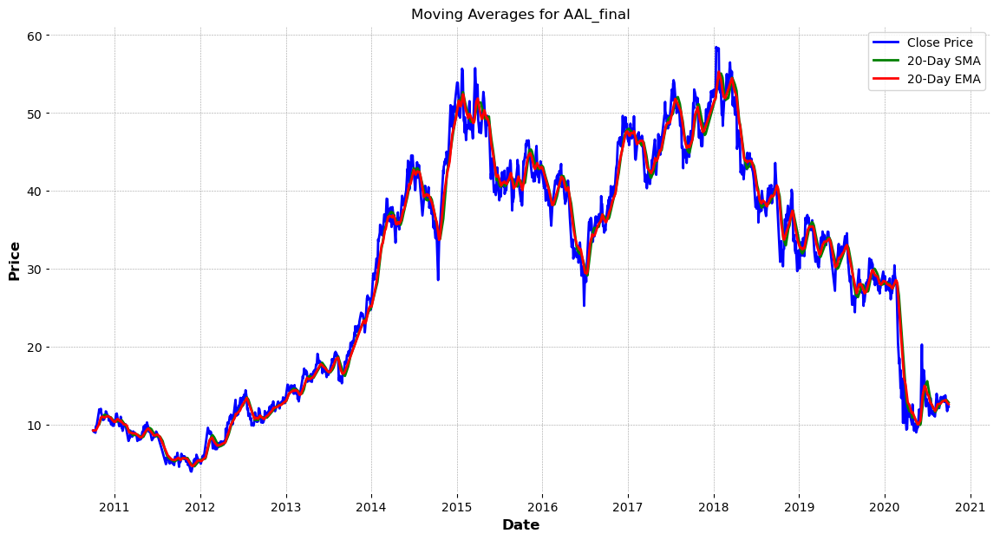

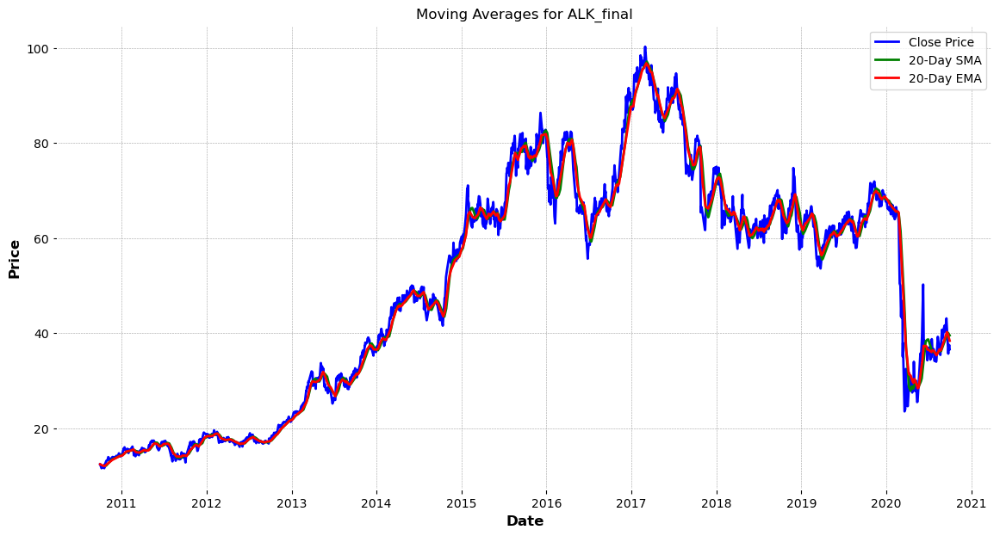

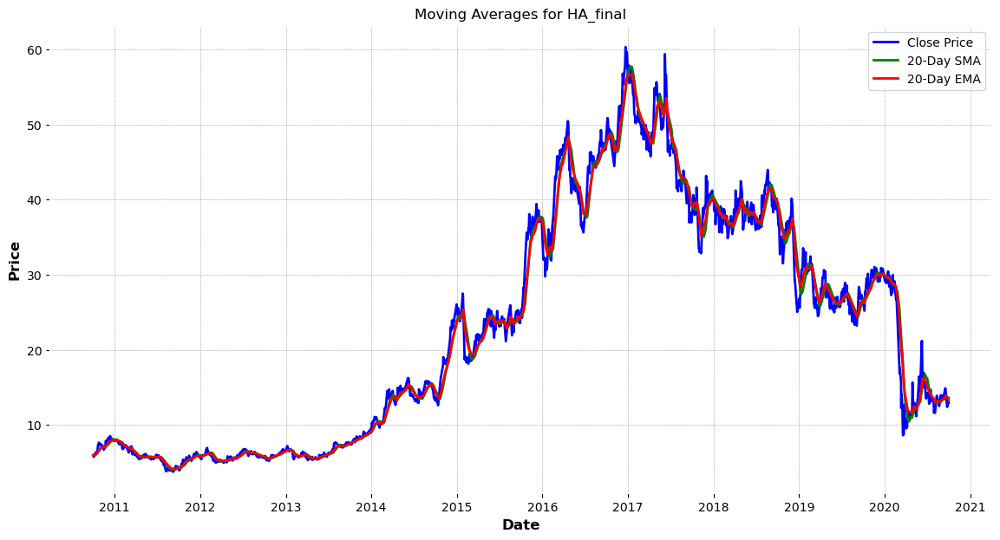

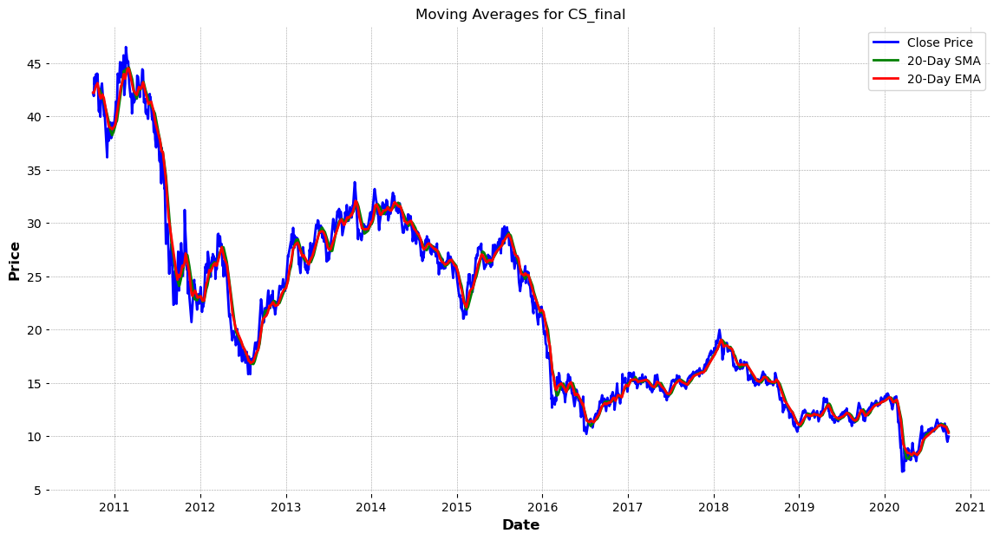

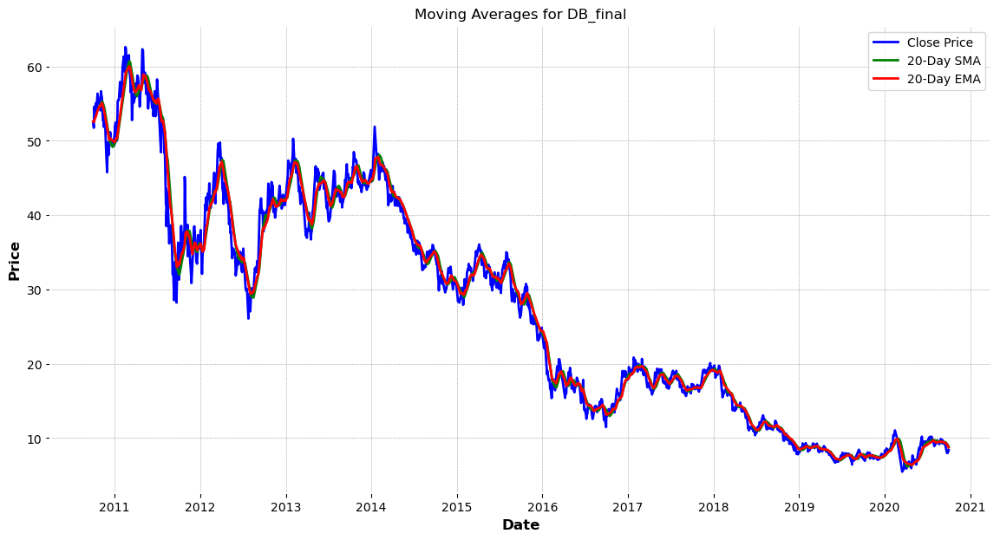

...

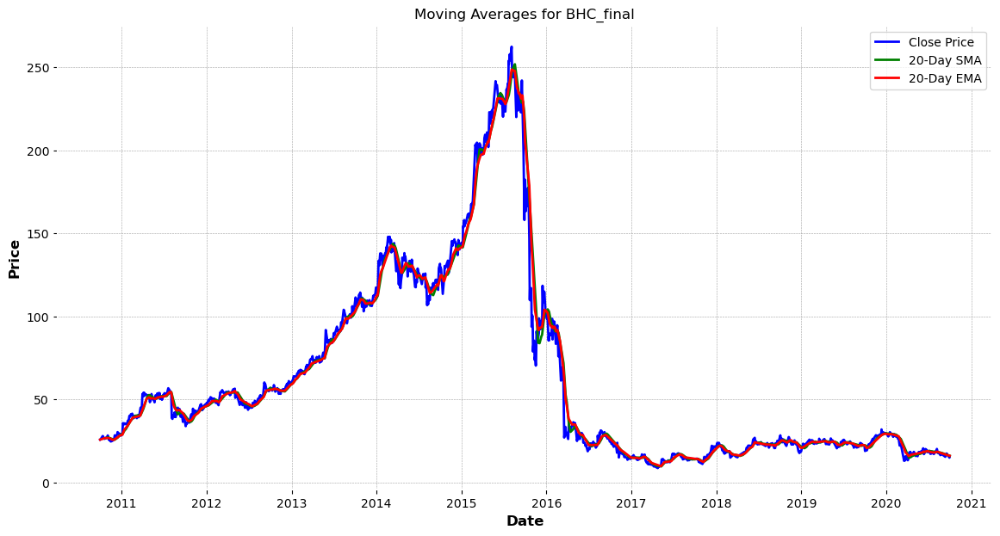

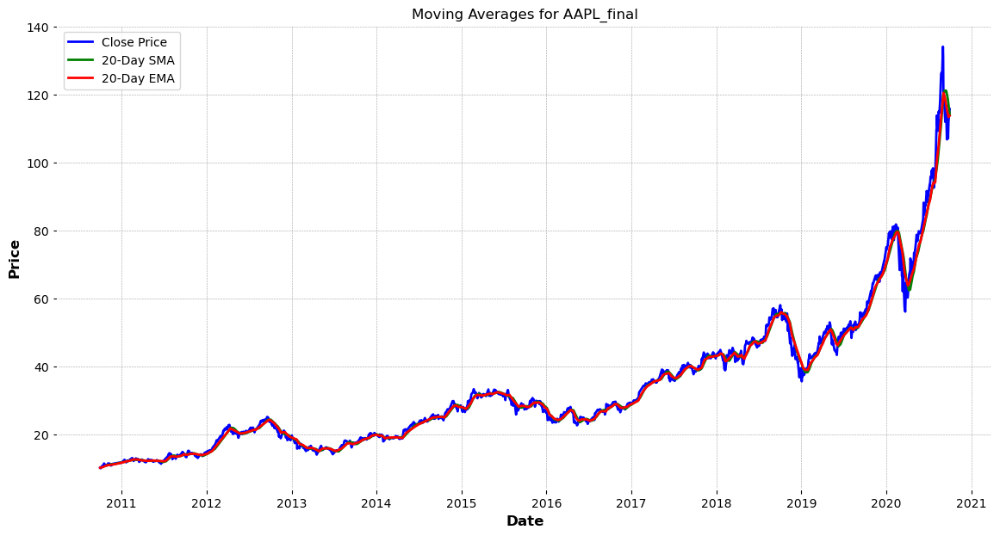

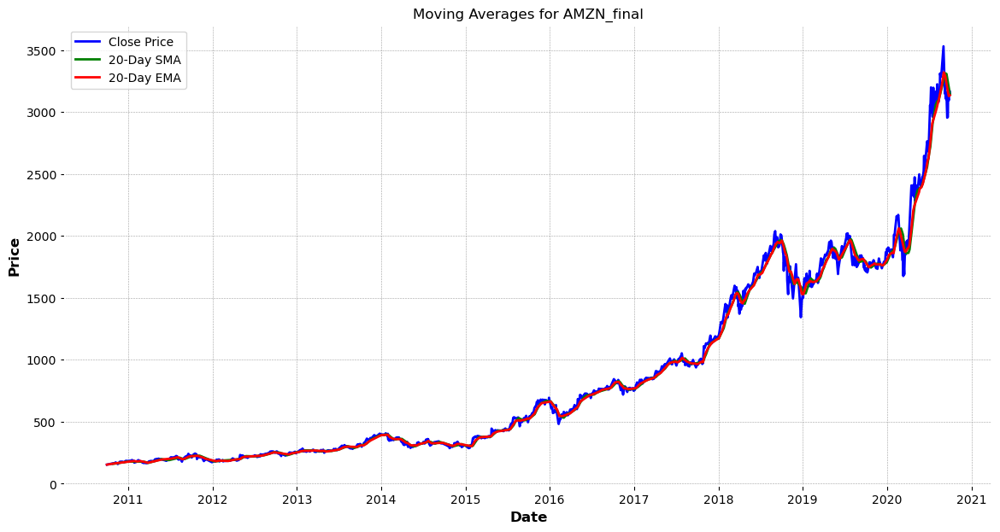

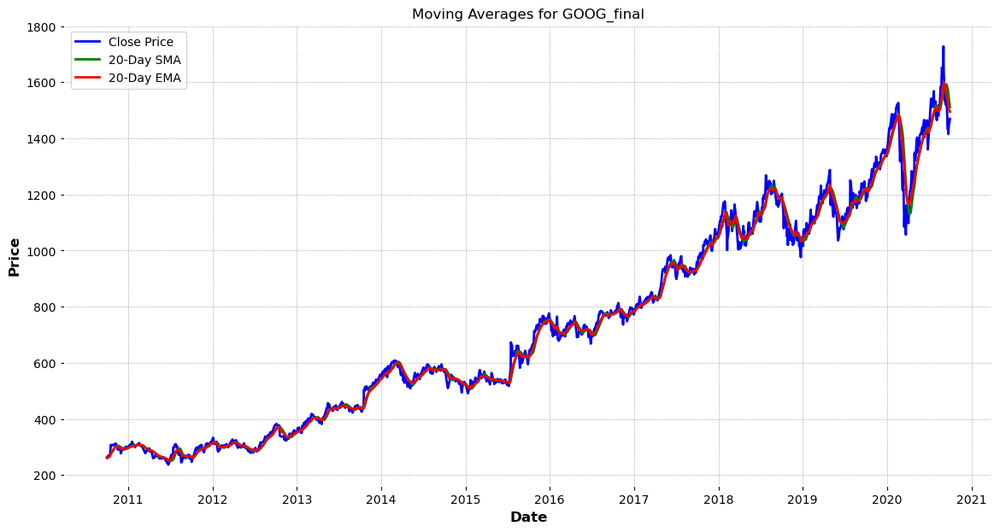

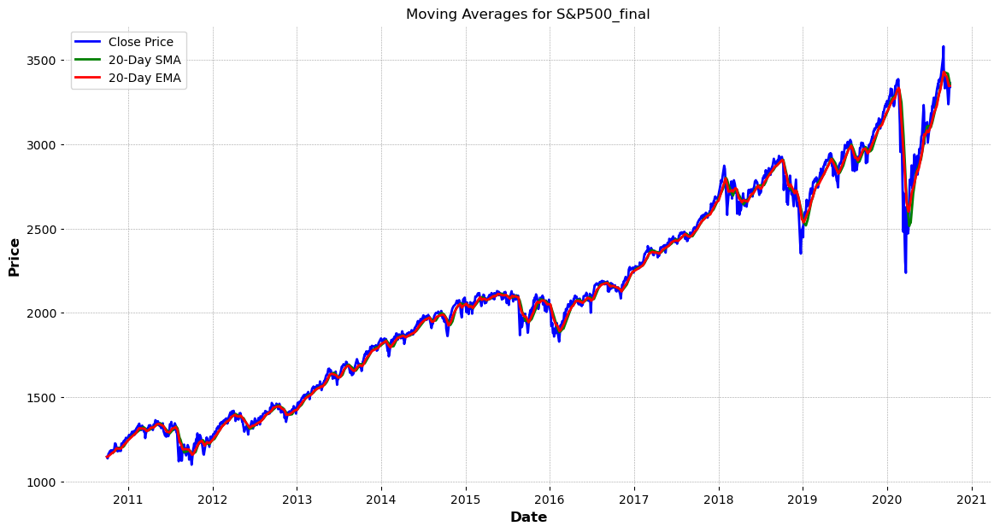

In [8]:
# Create a directory to save the plots
output_dir = "moving_averages"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_moving_averages(stock_name, df):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'].values, df['Close'].values, label='Close Price', color='blue')
    plt.plot(df['Date'].values, df['SMA_20'].values, label='20-Day SMA', color='green')
    plt.plot(df['Date'].values, df['EMA_20'].values, label='20-Day EMA', color='red')
    plt.title(f'Moving Averages for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{stock_name}_moving_averages.png'))
    plt.show()

# Plot moving average charts for each stock
for stock_name, df in stocks.items():
    plot_moving_averages(stock_name, df)  


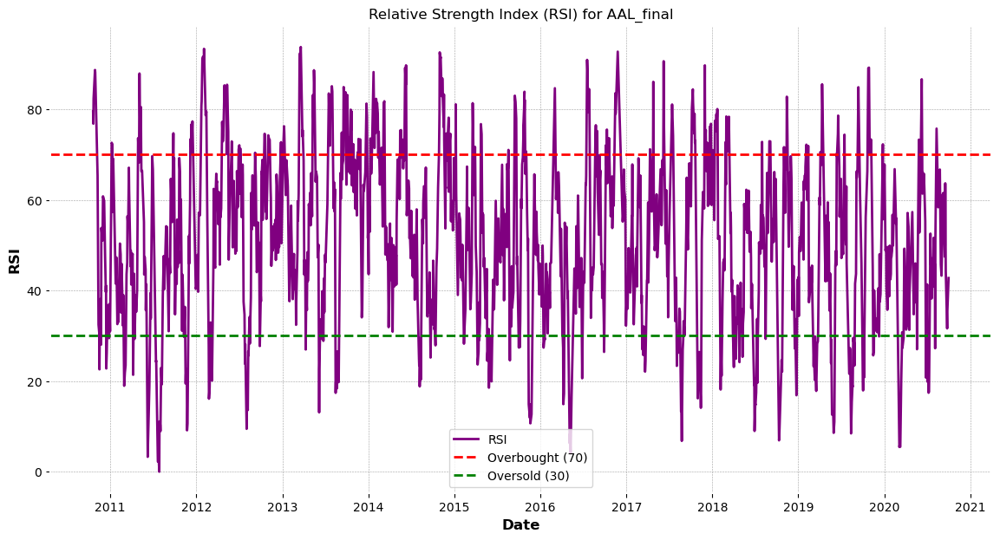

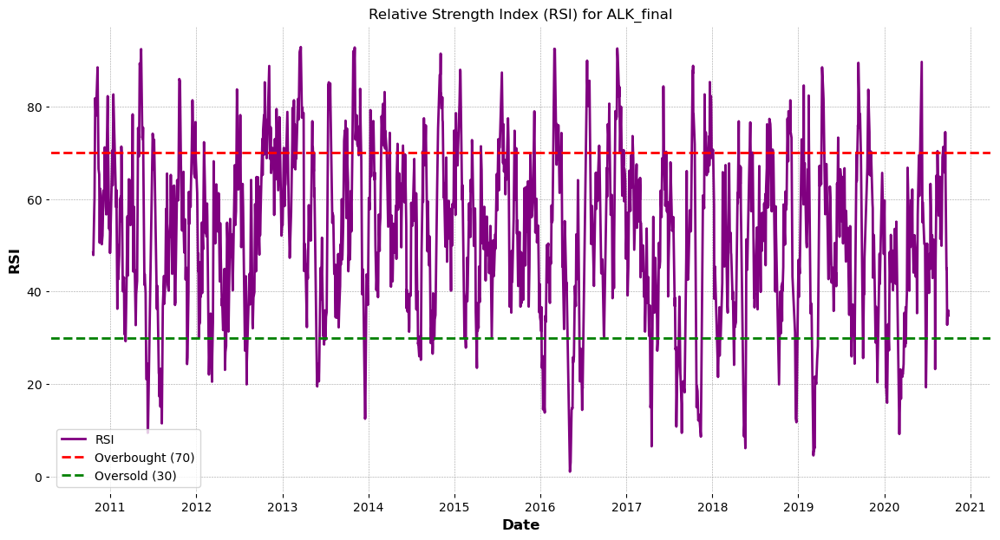

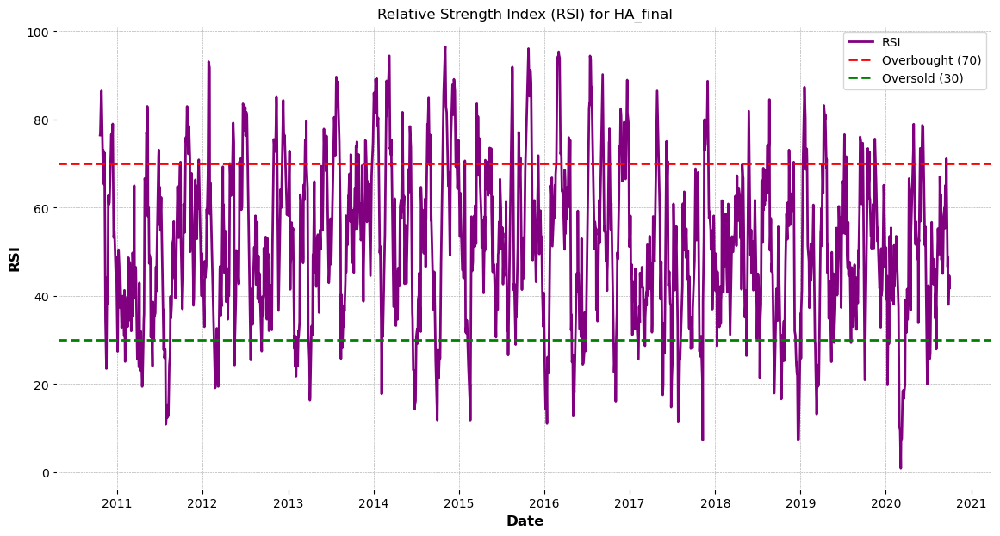

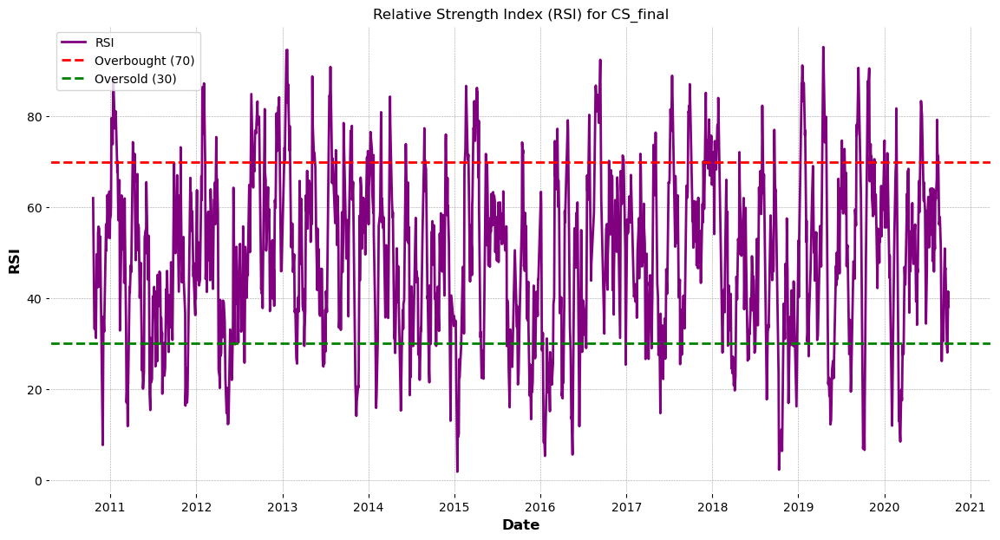

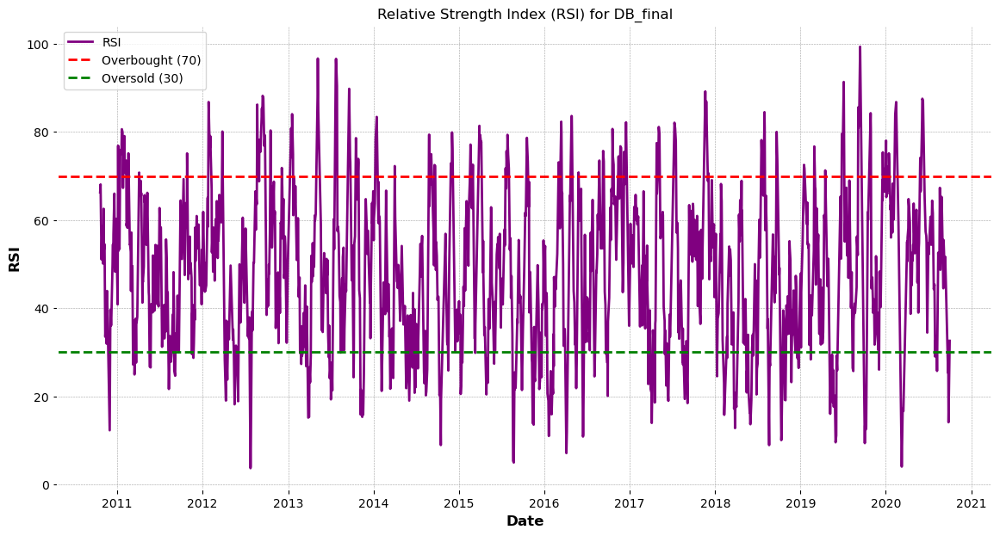

...

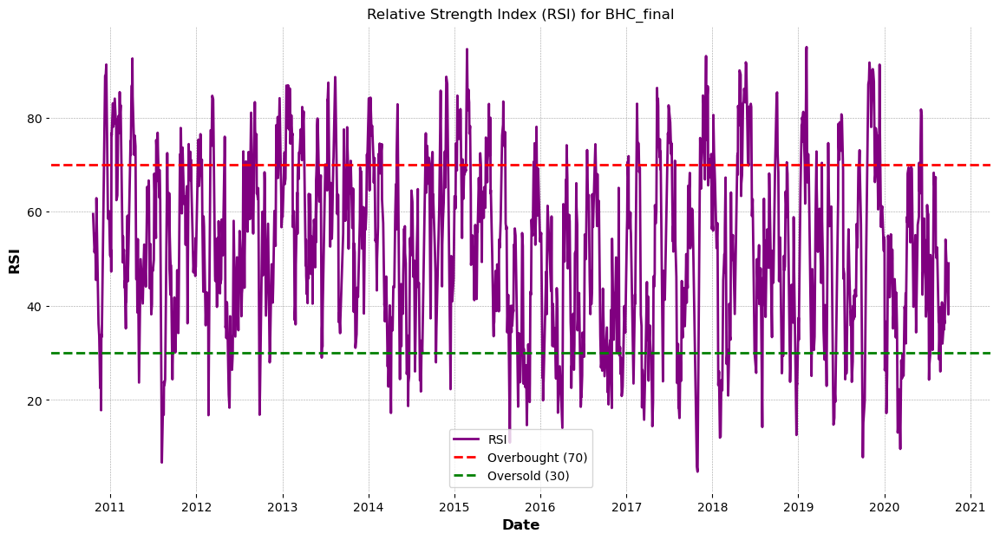

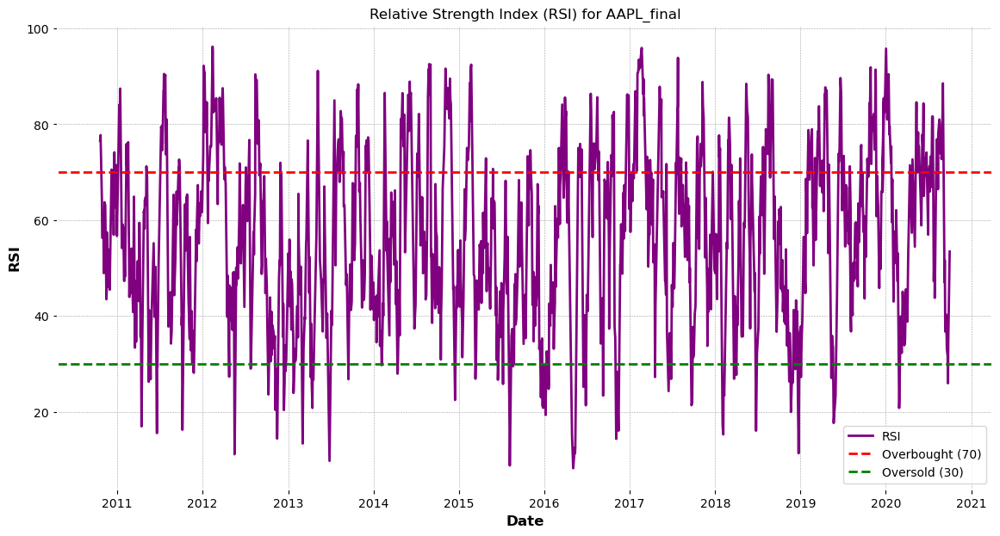

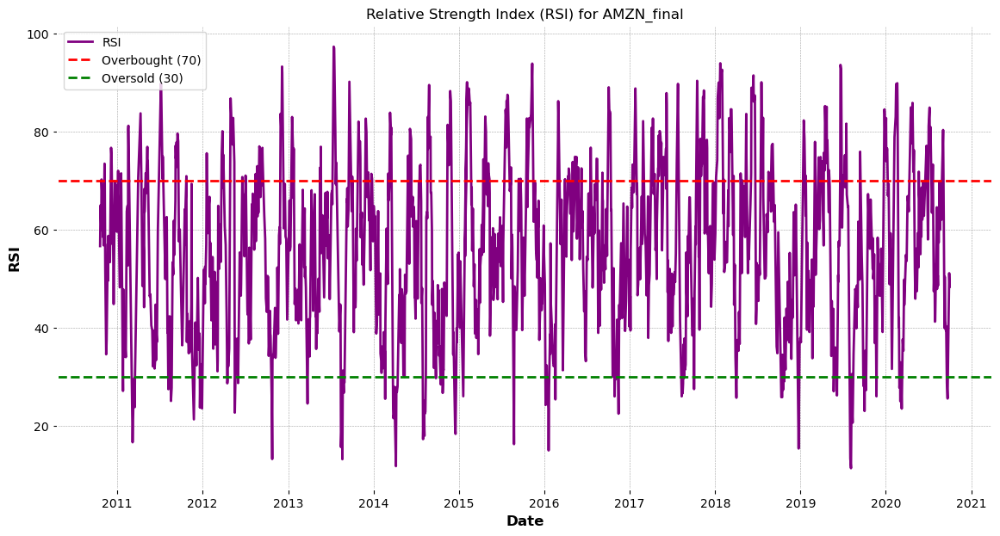

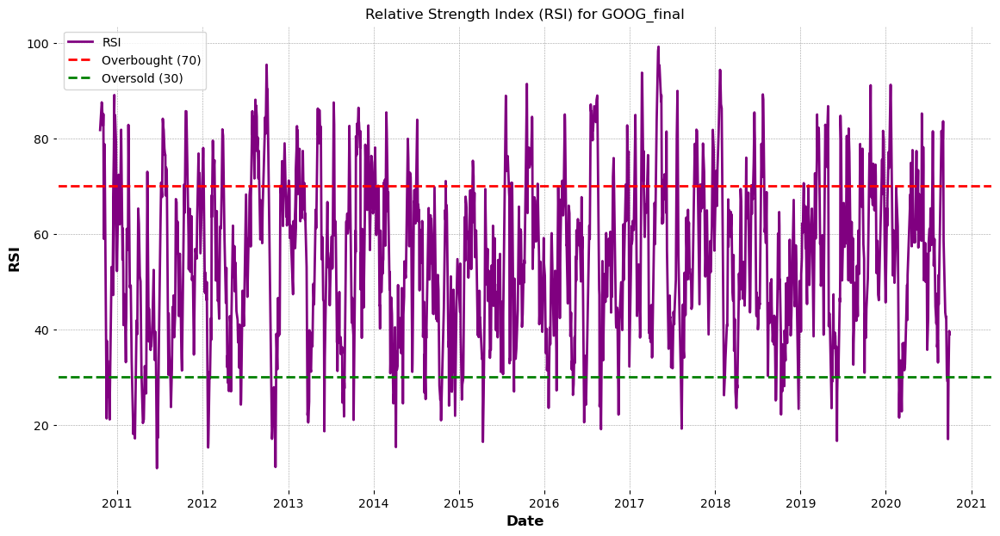

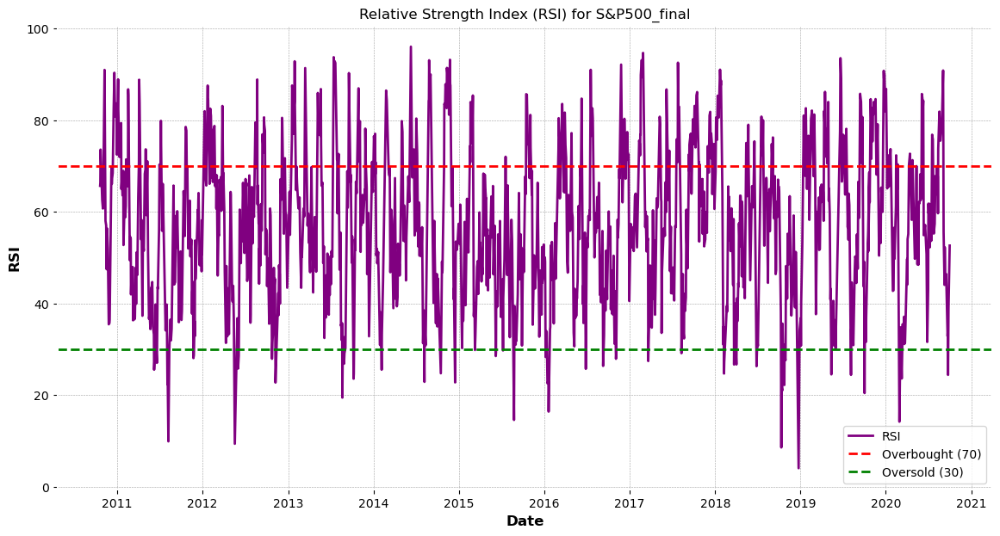

In [9]:
# Create a directory to save the RSI plots
output_dir = "rsi_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_rsi(stock_name, df):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'].values, df['RSI'].values, label='RSI', color='purple')
    plt.axhline(70, color='red', linestyle='--', label='Overbought (70)')
    plt.axhline(30, color='green', linestyle='--', label='Oversold (30)')
    plt.title(f'Relative Strength Index (RSI) for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{stock_name}_RSI.png'))
    plt.show()

# Plot RSI charts for each stock
for stock_name, df in stocks.items():
    plot_rsi(stock_name, df)


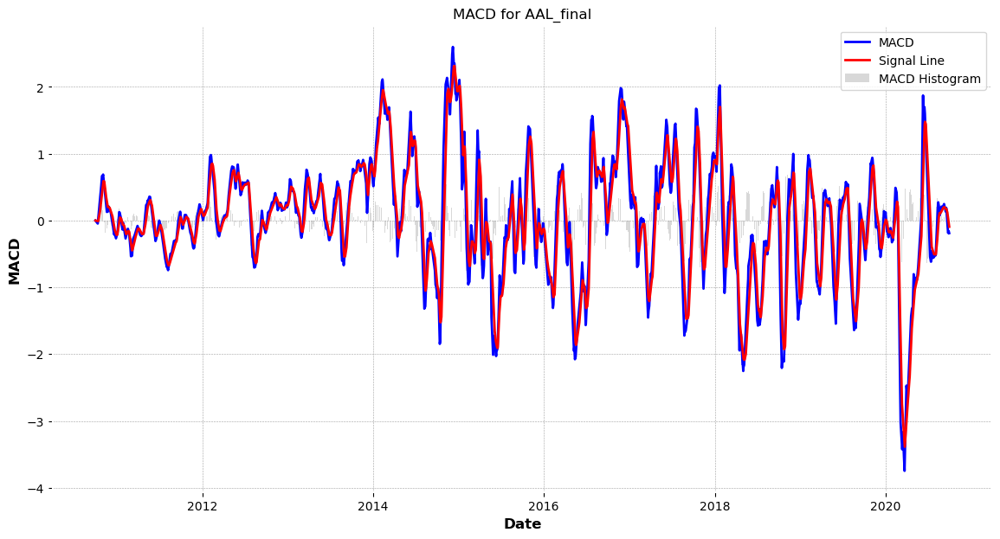

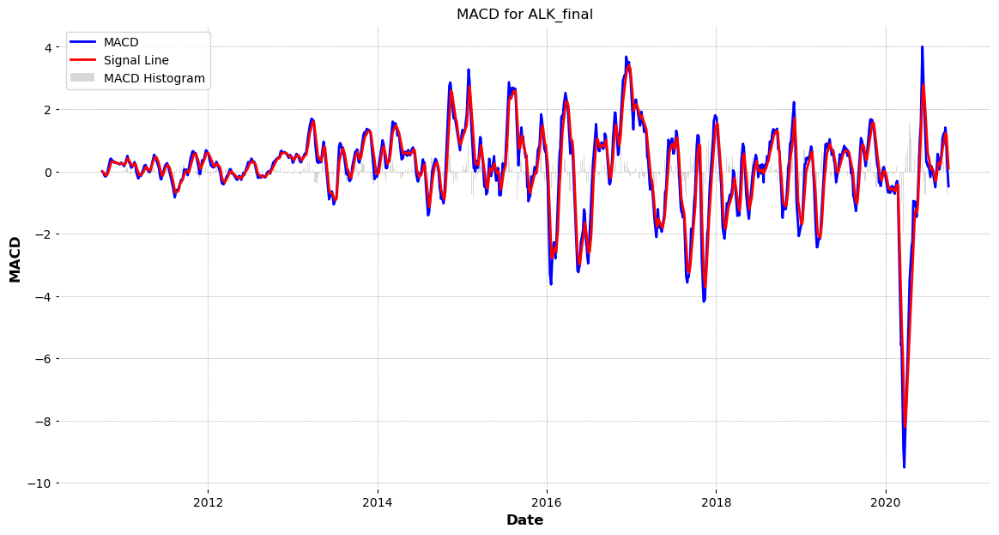

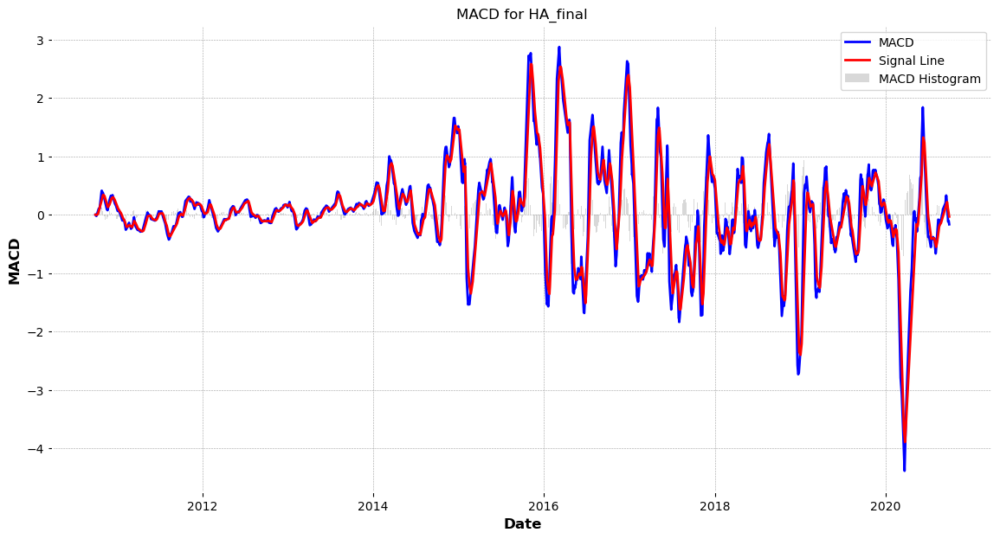

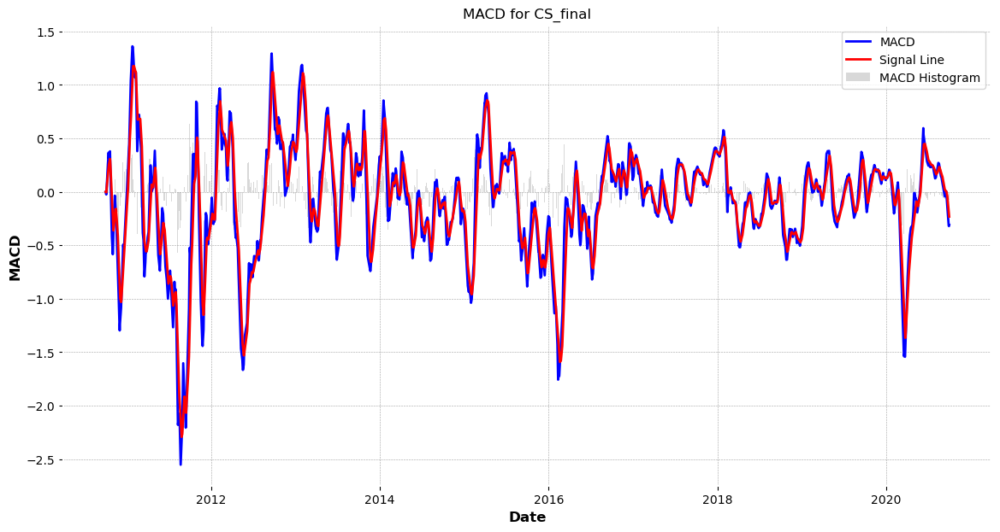

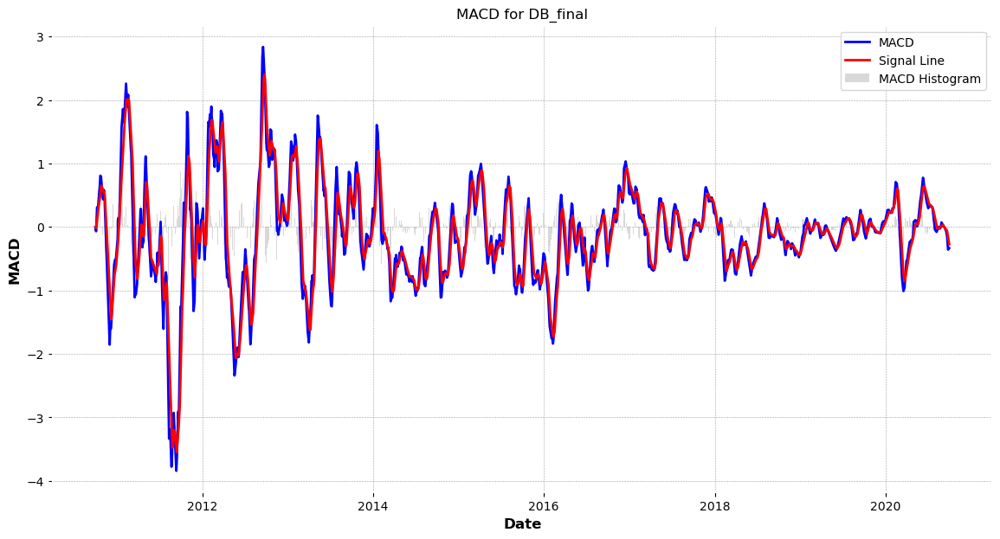

...

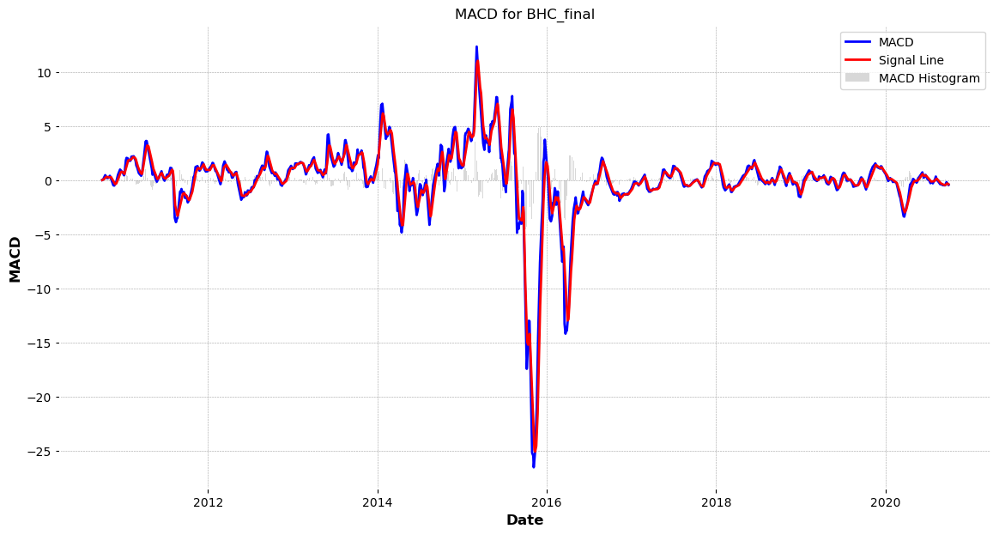

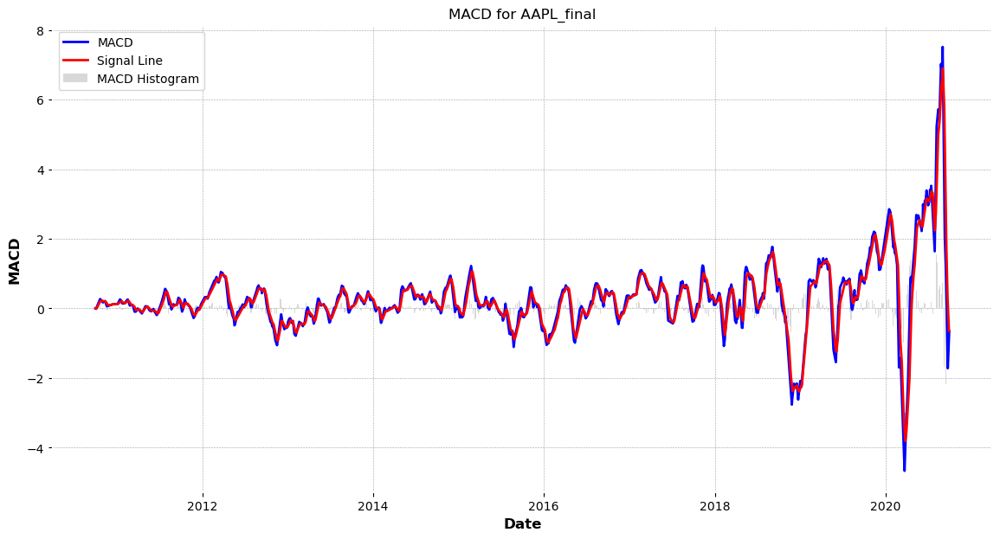

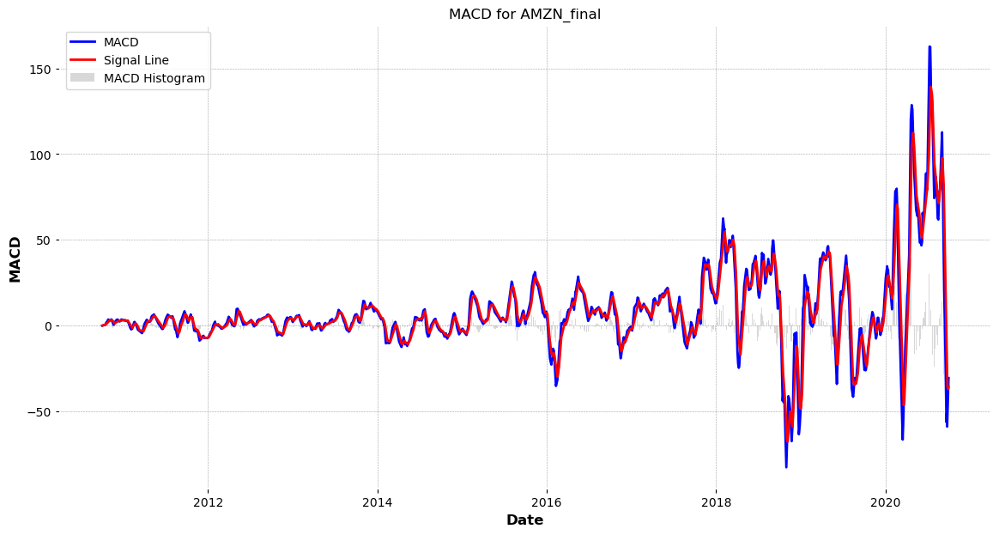

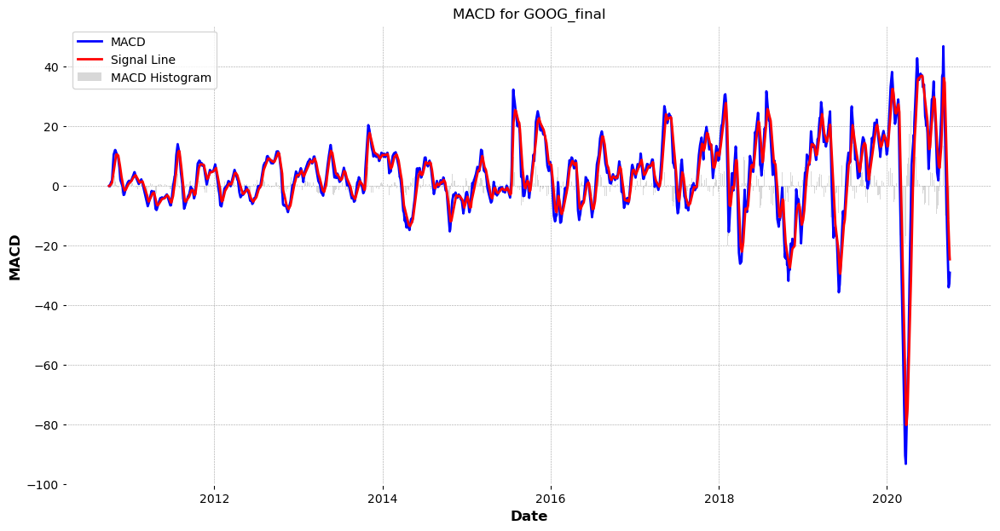

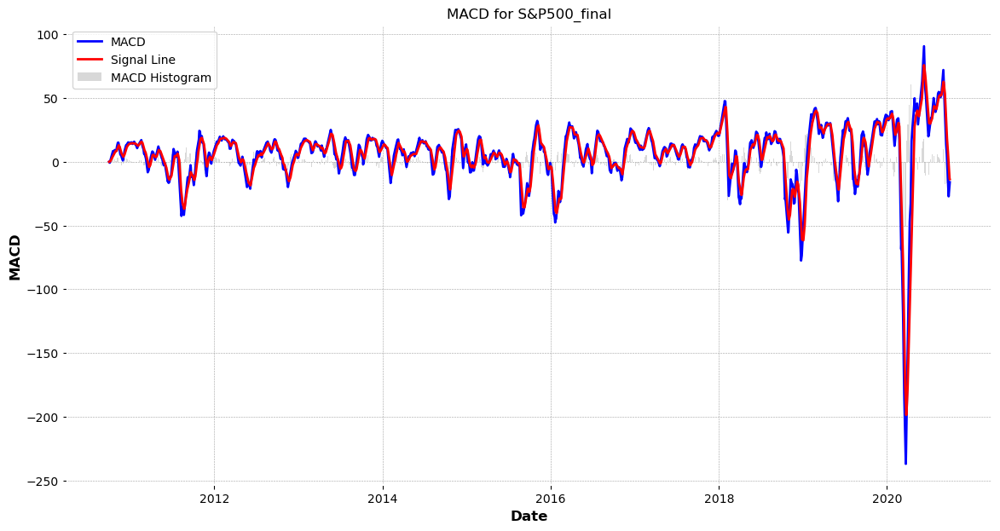

In [10]:
# Create a directory to save the MACD plots
output_dir = "macd_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_macd(stock_name, df):
    plt.figure(figsize=(14, 7))
    
    # Plot the MACD and Signal Line
    plt.plot(df['Date'].values, df['MACD'].values, label='MACD', color='blue')
    plt.plot(df['Date'].values, df['Signal_Line'].values, label='Signal Line', color='red')
    
    # Plot the MACD Histogram
    plt.bar(df['Date'].values, df['MACD'].values - df['Signal_Line'].values, label='MACD Histogram', color='gray', alpha=0.3)
    
    plt.title(f'MACD for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{stock_name}_MACD.png'))
    plt.show()

# Plot MACD charts for each stock
for stock_name, df in stocks.items():
    plot_macd(stock_name, df)


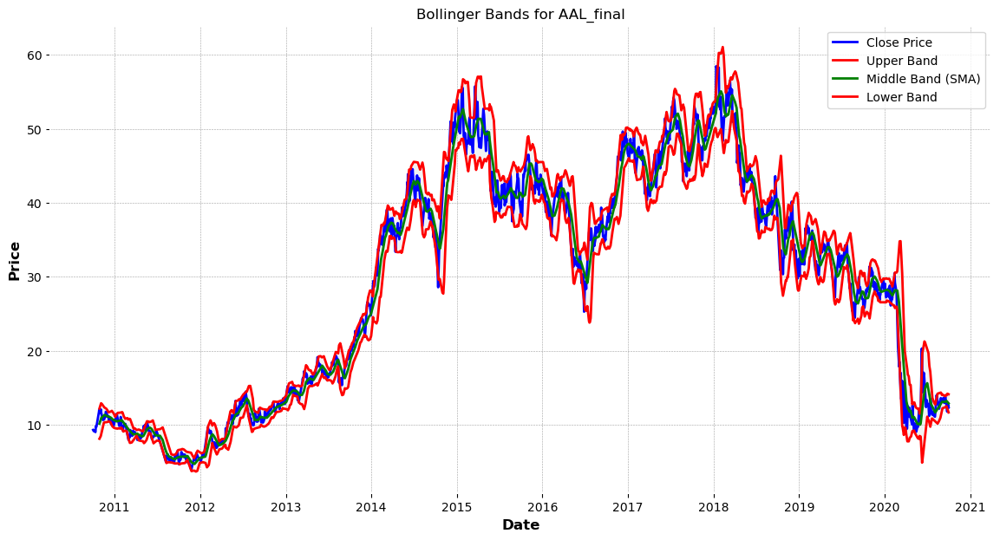

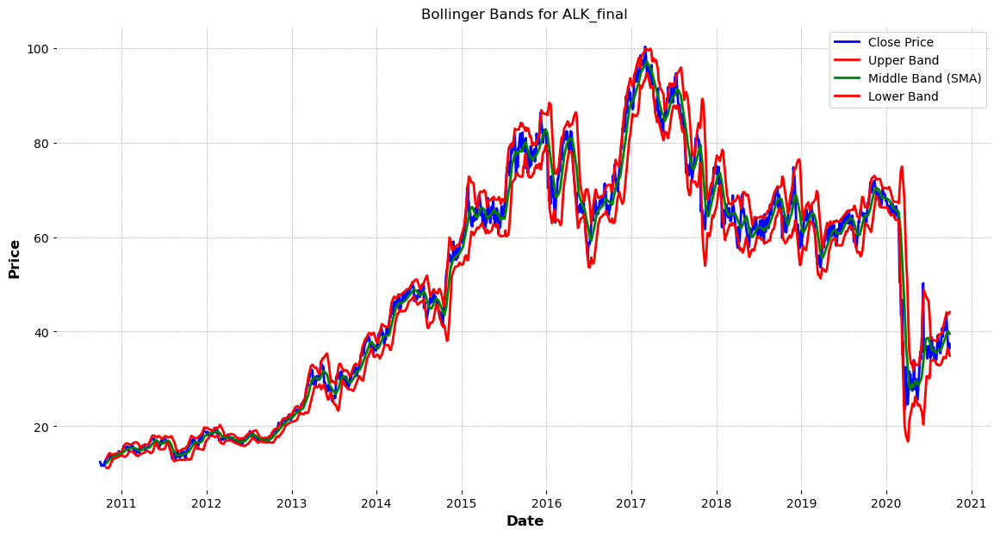

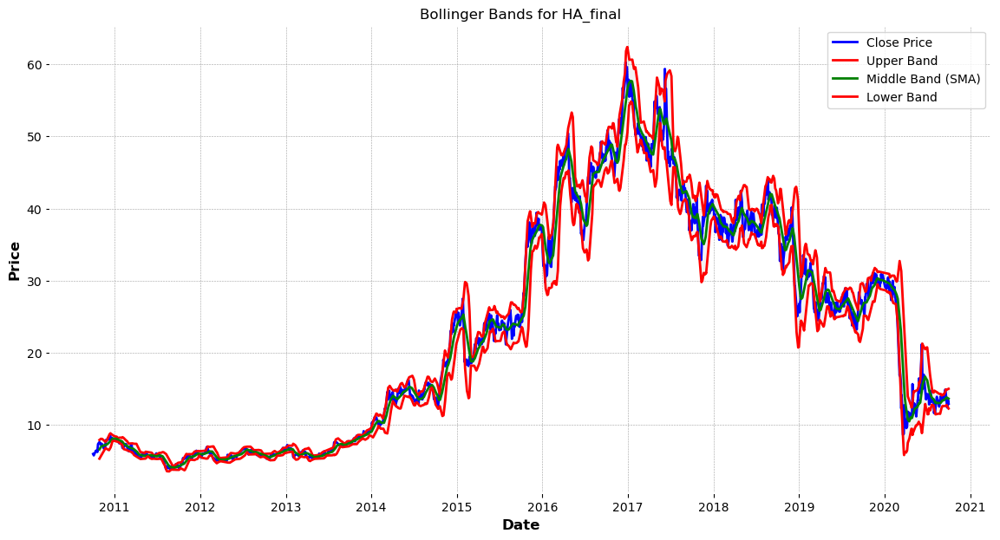

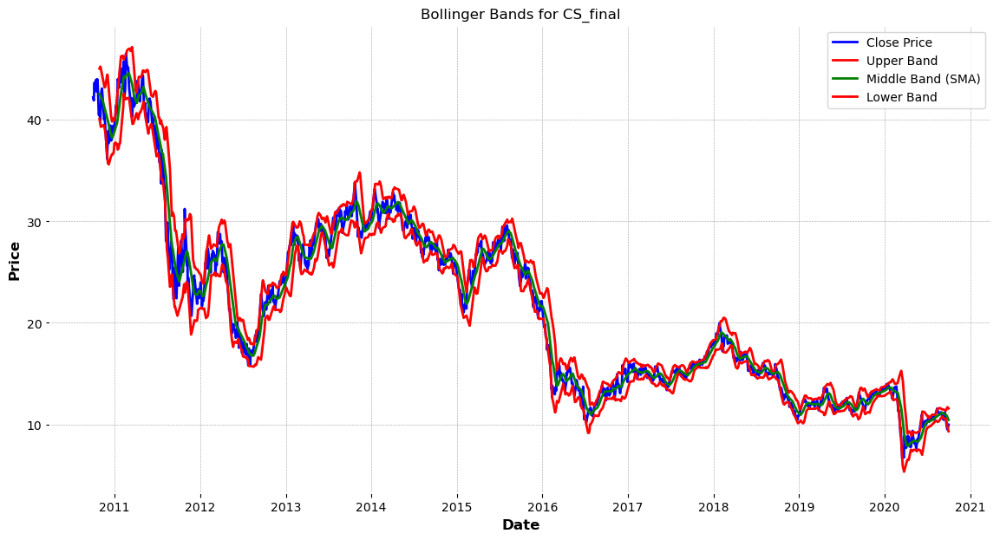

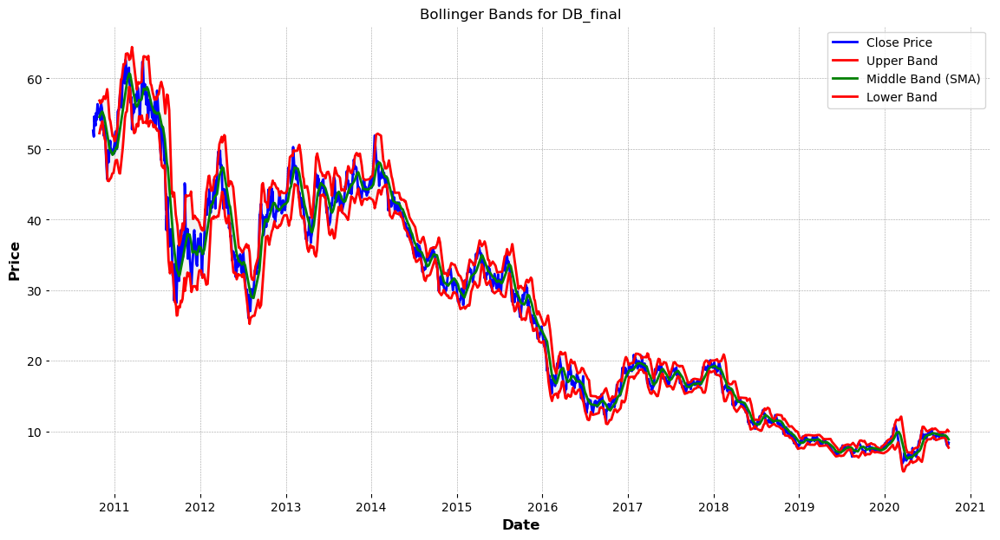

...

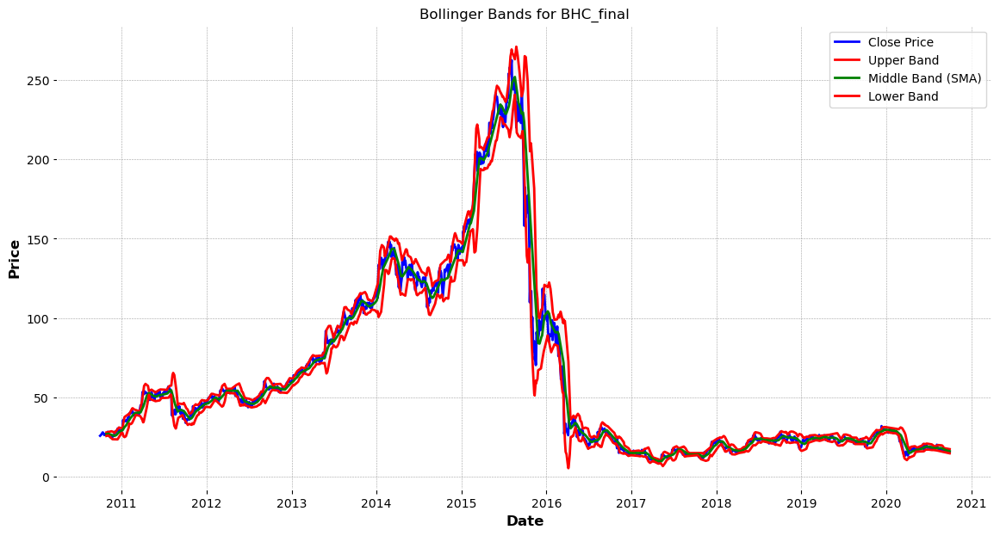

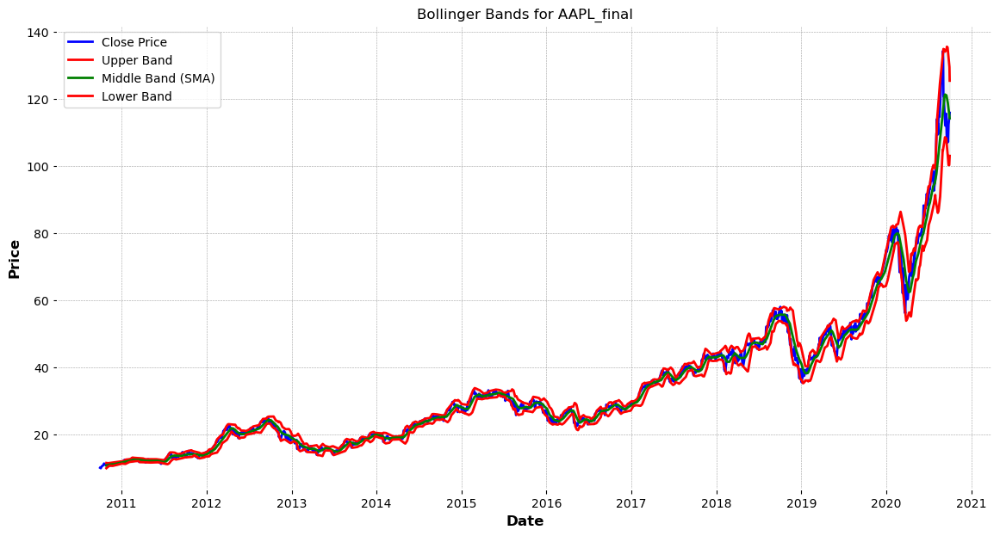

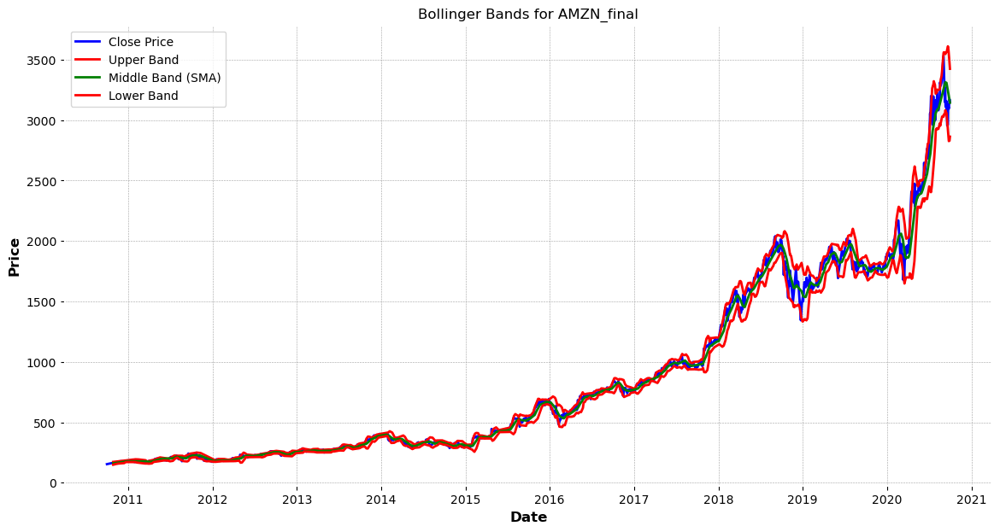

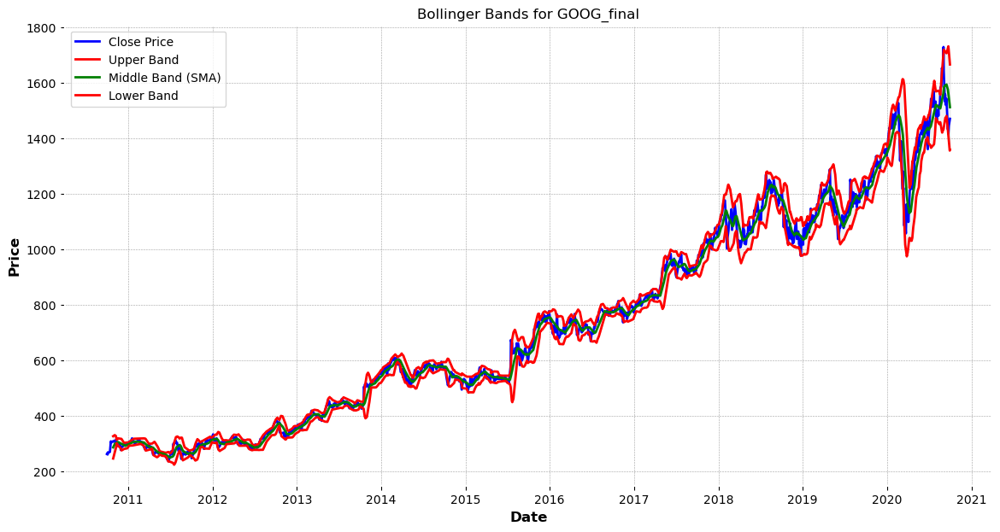

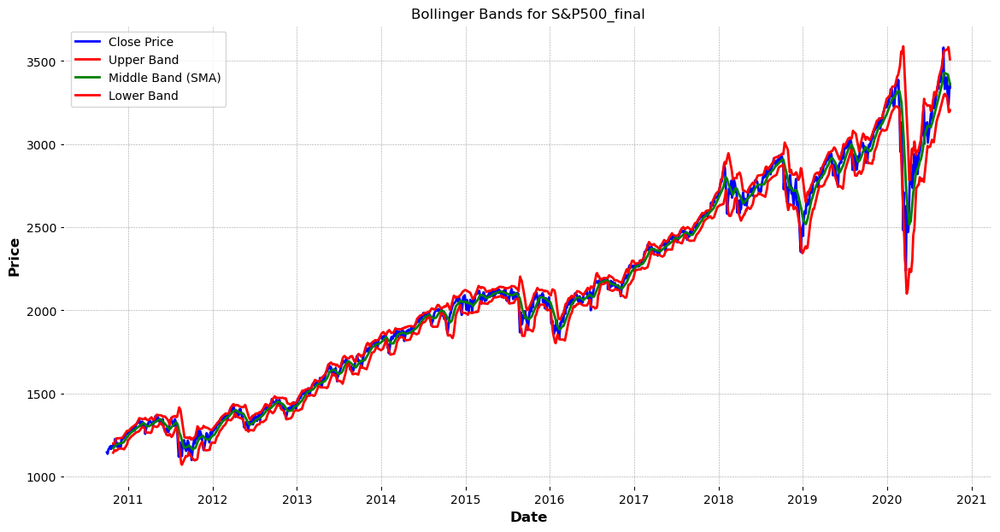

In [11]:
# Create a directory to save the Bollinger Bands plots
output_dir = "bollinger_bands_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_bollinger_bands(stock_name, df):
    plt.figure(figsize=(14, 7))
    
    # Plot the closing price
    plt.plot(df['Date'].values, df['Close'].values, label='Close Price', color='blue')
    
    # Plot the Bollinger Bands
    plt.plot(df['Date'].values, df['Upper_Band'].values, label='Upper Band', color='red')
    plt.plot(df['Date'].values, df['Middle_Band'].values, label='Middle Band (SMA)', color='green')
    plt.plot(df['Date'].values, df['Lower_Band'].values, label='Lower Band', color='red')
    
    plt.fill_between(df['Date'].values, df['Lower_Band'].values, df['Upper_Band'].values, color='gray', alpha=0.1)
    
    plt.title(f'Bollinger Bands for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{stock_name}_Bollinger_Bands.png'))
    plt.show()

# Plot Bollinger Bands charts for each stock
for stock_name, df in stocks.items():
    plot_bollinger_bands(stock_name, df)



------------

#### Step 4: Risk and Return Metrics
1.	Daily Returns: Calculate daily returns for each stock.
2.	Annualized Return and Volatility: Calculate annualized return and volatility.
3.	Sharpe Ratio: Calculate the Sharpe Ratio for risk-adjusted return.

In [12]:
def calculate_daily_returns(df):
    df['Daily_Return'] = df['Close'].pct_change()
    return df

# Apply daily returns calculation to each stock
for stock_name, df in stocks.items():
    stocks[stock_name] = calculate_daily_returns(df)


In [13]:
def calculate_annualized_metrics(df):
    # Assuming 252 trading days in a year
    trading_days = 252
    
    # Calculate annualized return
    annualized_return = (1 + df['Daily_Return'].mean()) ** trading_days - 1
    
    # Calculate annualized volatility
    annualized_volatility = df['Daily_Return'].std() * (trading_days ** 0.5)
    
    return annualized_return, annualized_volatility

# Calculate metrics for each stock
annualized_metrics = {}
for stock_name, df in stocks.items():
    annualized_return, annualized_volatility = calculate_annualized_metrics(df)
    annualized_metrics[stock_name] = {
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility
    }

# Display the results
for stock_name, metrics in annualized_metrics.items():
    print(f"{stock_name}:")
    print(f"Annualized Return: {metrics['Annualized Return']:.4f}")
    print(f"Annualized Volatility: {metrics['Annualized Volatility']:.4f}\n")


AAL_final:
Annualized Return: 0.1740
Annualized Volatility: 0.5195

ALK_final:
Annualized Return: 0.1957
Annualized Volatility: 0.3740

HA_final:
Annualized Return: 0.2126
Annualized Volatility: 0.4786

CS_final:
Annualized Return: -0.0786
Annualized Volatility: 0.3525

DB_final:
Annualized Return: -0.0916
Annualized Volatility: 0.4187

GS_final:
Annualized Return: 0.0759
Annualized Volatility: 0.2910

JNJ_final:
Annualized Return: 0.1085
Annualized Volatility: 0.1722

MRK_final:
Annualized Return: 0.1089
Annualized Volatility: 0.2071

BHC_final:
Annualized Return: 0.1241
Annualized Volatility: 0.5667

AAPL_final:
Annualized Return: 0.3284
Annualized Volatility: 0.2813

AMZN_final:
Annualized Return: 0.4218
Annualized Volatility: 0.3157

GOOG_final:
Annualized Return: 0.2287
Annualized Volatility: 0.2586

S&P500_final:
Annualized Return: 0.1308
Annualized Volatility: 0.1736



In [14]:
def calculate_sharpe_ratio(annualized_return, annualized_volatility, risk_free_rate=0.75):
    return (annualized_return - risk_free_rate) / annualized_volatility

# Calculate Sharpe Ratio for each stock
for stock_name, metrics in annualized_metrics.items():
    sharpe_ratio = calculate_sharpe_ratio(metrics['Annualized Return'], metrics['Annualized Volatility'])
    annualized_metrics[stock_name]['Sharpe Ratio'] = sharpe_ratio

# Display the results
for stock_name, metrics in annualized_metrics.items():
    print(f"{stock_name}:")
    print(f"Annualized Return: {metrics['Annualized Return']:.4f}")
    print(f"Annualized Volatility: {metrics['Annualized Volatility']:.4f}")
    print(f"Sharpe Ratio: {metrics['Sharpe Ratio']:.4f}\n")


AAL_final:
Annualized Return: 0.1740
Annualized Volatility: 0.5195
Sharpe Ratio: -1.1087

ALK_final:
Annualized Return: 0.1957
Annualized Volatility: 0.3740
Sharpe Ratio: -1.4819

HA_final:
Annualized Return: 0.2126
Annualized Volatility: 0.4786
Sharpe Ratio: -1.1230

CS_final:
Annualized Return: -0.0786
Annualized Volatility: 0.3525
Sharpe Ratio: -2.3507

DB_final:
Annualized Return: -0.0916
Annualized Volatility: 0.4187
Sharpe Ratio: -2.0103

GS_final:
Annualized Return: 0.0759
Annualized Volatility: 0.2910
Sharpe Ratio: -2.3164

JNJ_final:
Annualized Return: 0.1085
Annualized Volatility: 0.1722
Sharpe Ratio: -3.7257

MRK_final:
Annualized Return: 0.1089
Annualized Volatility: 0.2071
Sharpe Ratio: -3.0950

BHC_final:
Annualized Return: 0.1241
Annualized Volatility: 0.5667
Sharpe Ratio: -1.1045

AAPL_final:
Annualized Return: 0.3284
Annualized Volatility: 0.2813
Sharpe Ratio: -1.4988

AMZN_final:
Annualized Return: 0.4218
Annualized Volatility: 0.3157
Sharpe Ratio: -1.0393

GOOG_final

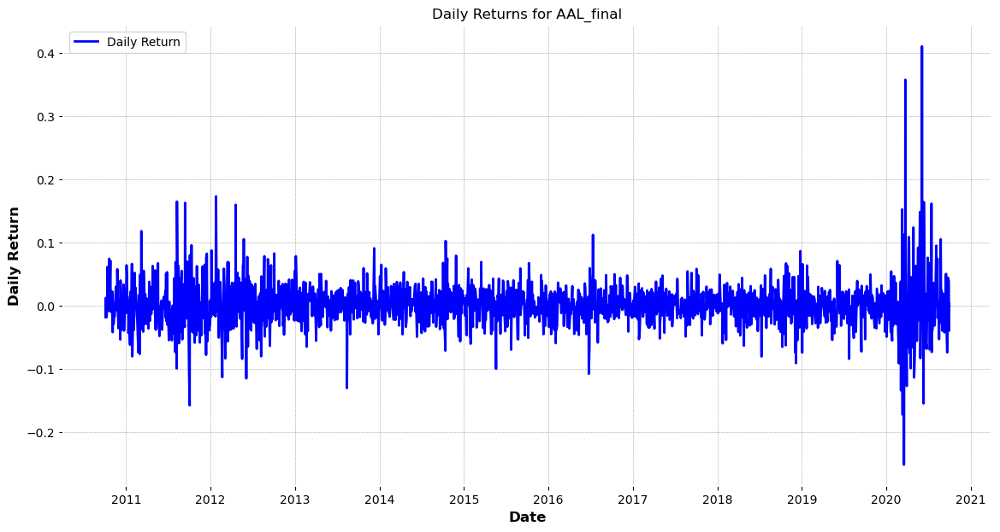

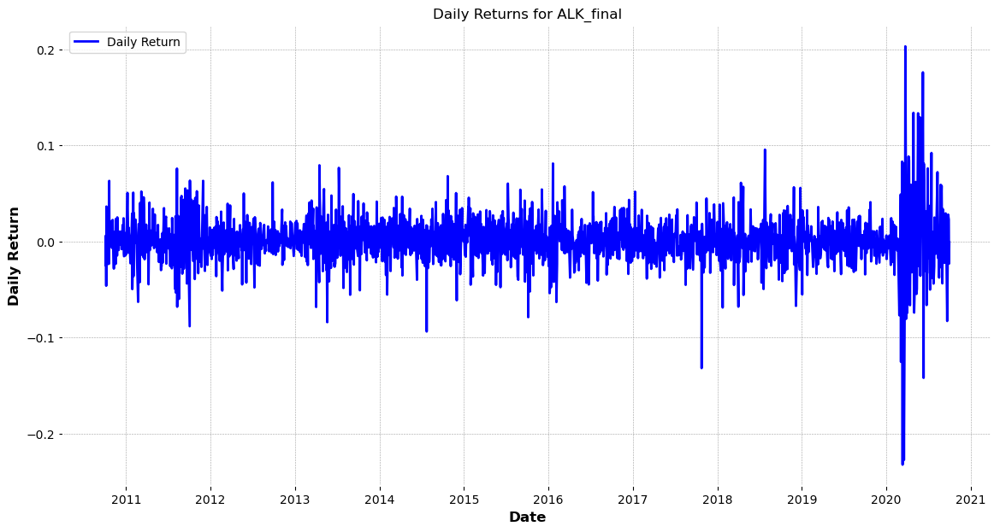

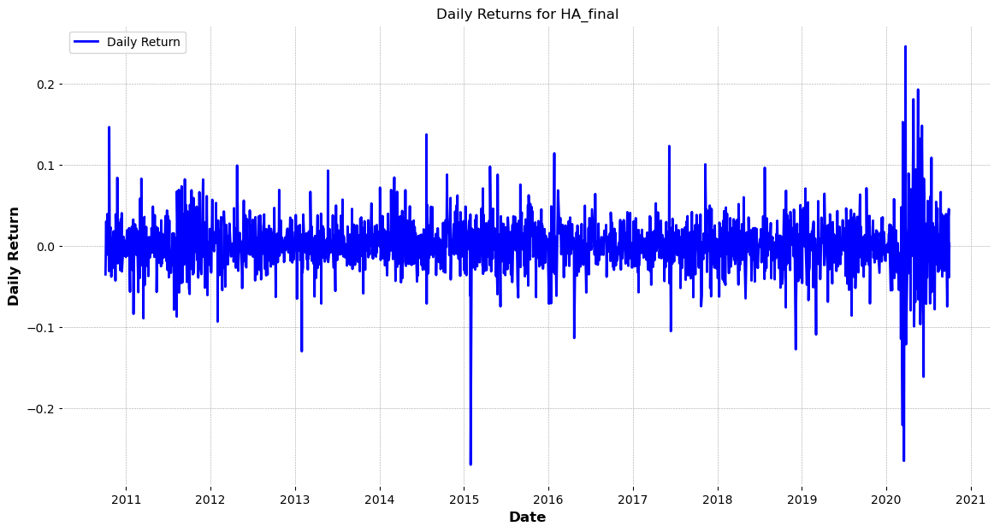

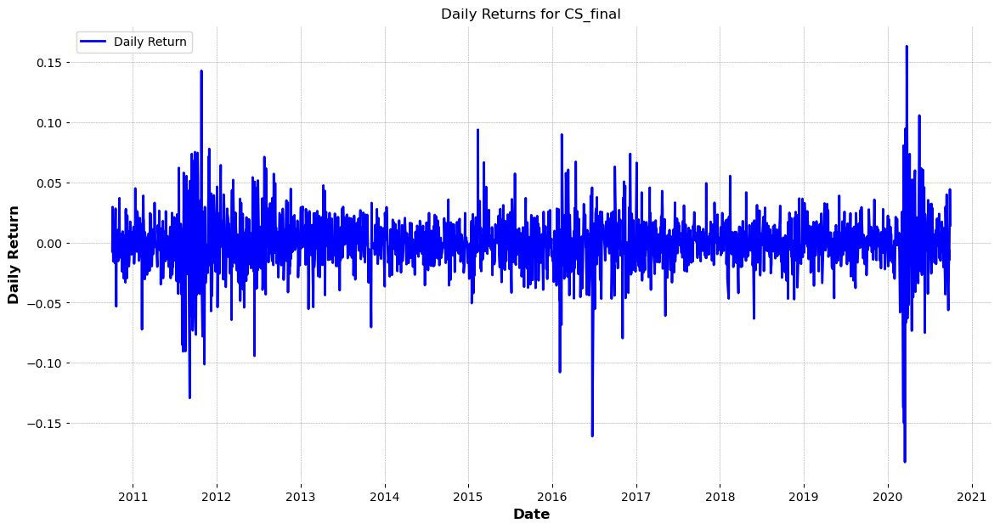

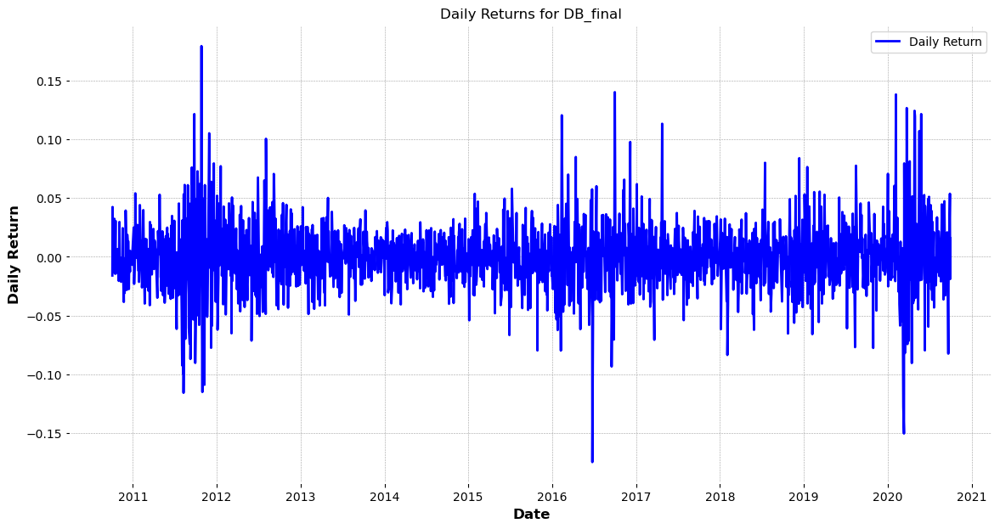

...

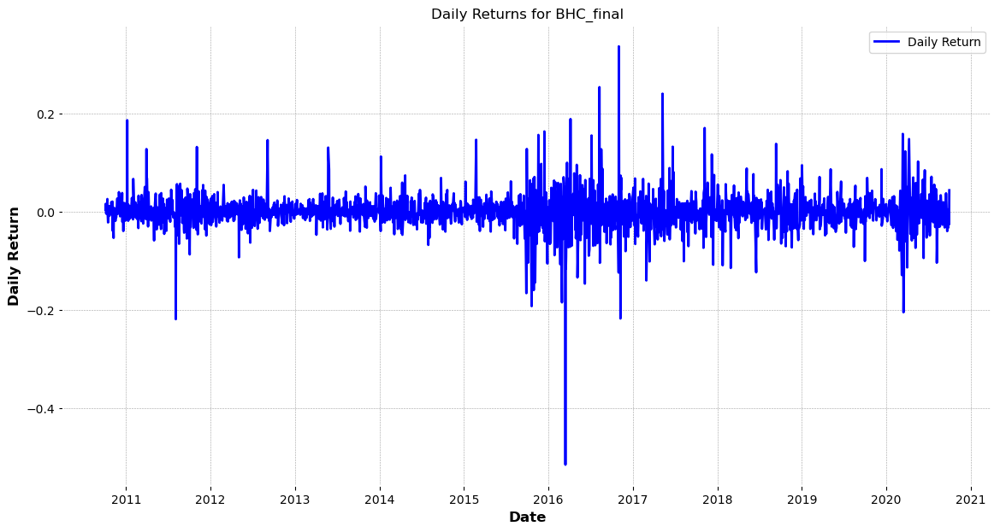

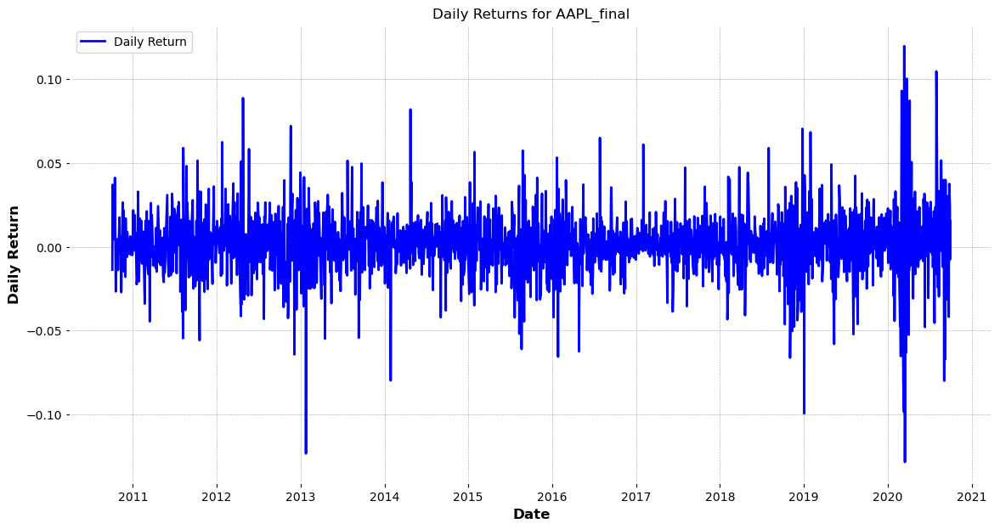

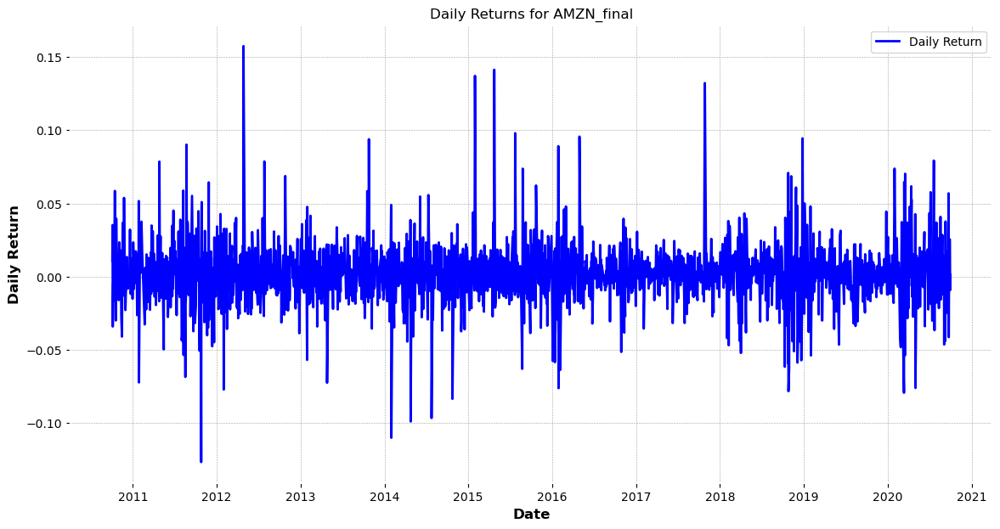

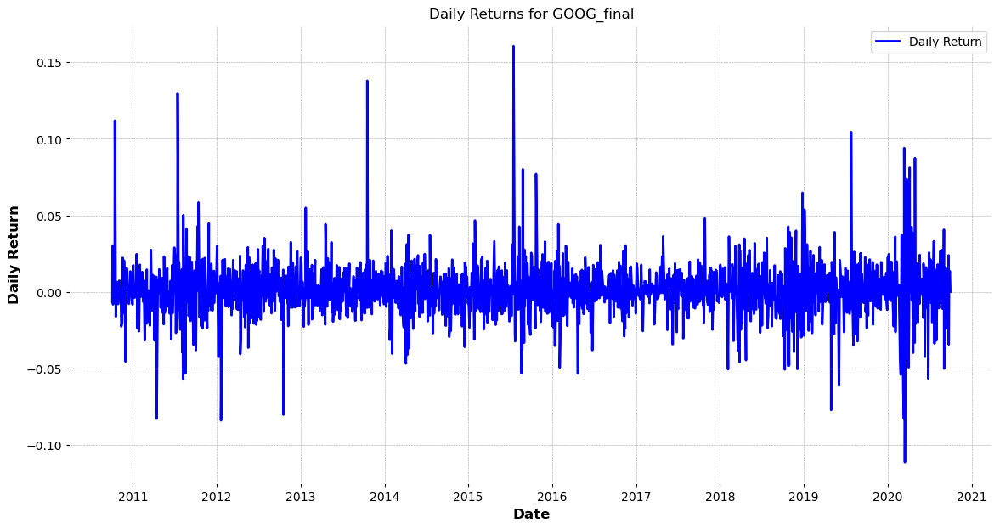

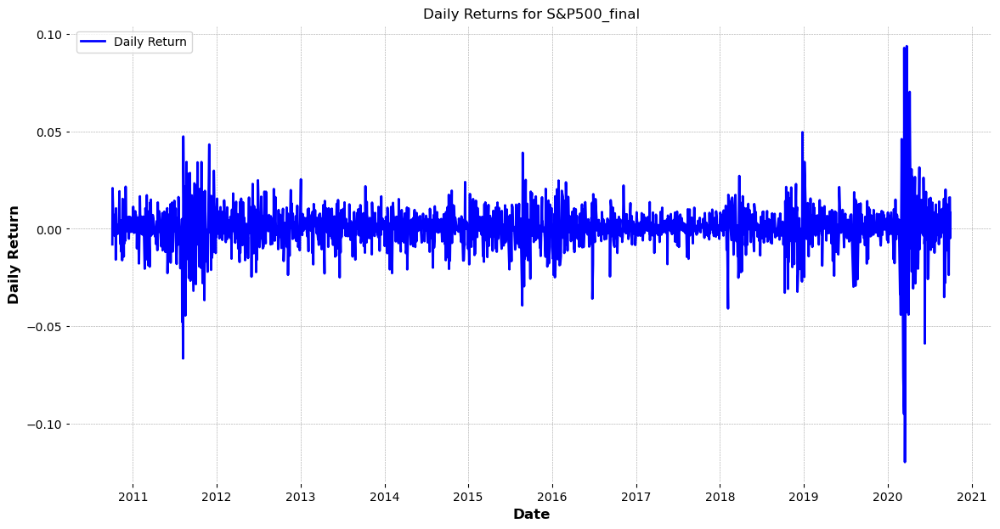

In [15]:
# Create a directory to save the Daily Return plots
output_dir = "daily_return_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_daily_return(stock_name, df):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'].values, df['Daily_Return'].values, label='Daily Return', color='blue')
    plt.title(f'Daily Returns for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.legend()
    plt.savefig(os.path.join(output_dir, f'{stock_name}_Daily_Return.png'))
    plt.show()

# Plot Daily Return charts for each stock
for stock_name, df in stocks.items():
    plot_daily_return(stock_name, df)


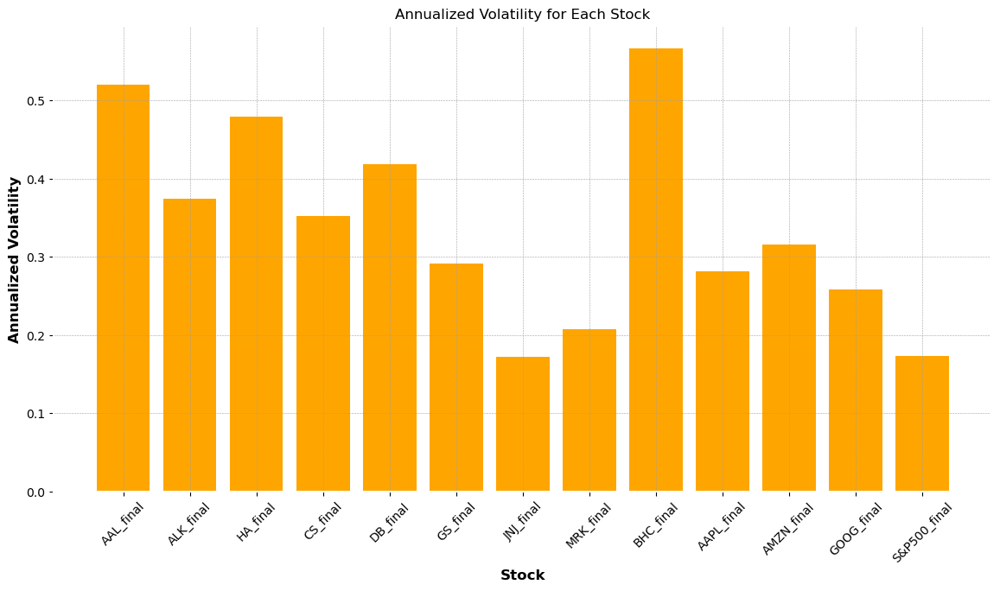

In [16]:
# Create a directory to save the Annualized Volatility plots
output_dir = "annualized_volatility_plots"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

def plot_annualized_volatility(annualized_metrics):
    stock_names = list(annualized_metrics.keys())
    volatilities = [metrics['Annualized Volatility'] for metrics in annualized_metrics.values()]
    
    plt.figure(figsize=(14, 7))
    plt.bar(stock_names, volatilities, color='orange')
    plt.title('Annualized Volatility for Each Stock')
    plt.xlabel('Stock')
    plt.ylabel('Annualized Volatility')
    plt.xticks(rotation=45)
    plt.savefig(os.path.join(output_dir, 'Annualized_Volatility.png'))
    plt.show()

# Plot the Annualized Volatility bar chart
plot_annualized_volatility(annualized_metrics)


-------------


#### Step 5: Compare Against S&P 500
1.	Benchmark Comparison: Compare the performance of each stock against the S&P 500 index.

    o	Calculate the beta of each stock relative to the S&P 500.
    o	Plot the stock returns against the S&P 500 returns.

In [17]:
# Calculate daily returns for the S&P 500
sp500 = stocks['S&P500_final']
sp500['Daily_Return'] = sp500['Close'].pct_change()

# Drop the first row since it will have NaN value for the first return
sp500 = sp500.dropna(subset=['Daily_Return']).reset_index(drop=True)

In [18]:
def calculate_beta(stock_df, market_df):
    # Ensure both stock and market data are aligned on dates
    aligned_df = pd.merge(stock_df[['Date', 'Daily_Return']], market_df[['Date', 'Daily_Return']],
                          on='Date', suffixes=('_stock', '_market'))

    # Calculate covariance between the stock's and the market's returns
    covariance = aligned_df['Daily_Return_stock'].cov(aligned_df['Daily_Return_market'])

    # Calculate variance of the market's returns
    market_variance = aligned_df['Daily_Return_market'].var()

    # Calculate beta
    beta = covariance / market_variance
    return beta

# Calculate beta for each stock
beta_values = {}
for stock_name, df in stocks.items():
    if stock_name != 'S&P500':  # Skip the S&P 500 itself
        beta = calculate_beta(df, sp500)
        beta_values[stock_name] = beta

# Display the beta values
for stock_name, beta in beta_values.items():
    print(f"{stock_name}: Beta = {beta:.4f}")


AAL_final: Beta = 1.3536
ALK_final: Beta = 1.2315
HA_final: Beta = 1.2335
CS_final: Beta = 1.3700
DB_final: Beta = 1.5375
GS_final: Beta = 1.3013
JNJ_final: Beta = 0.6622
MRK_final: Beta = 0.7335
BHC_final: Beta = 1.3160
AAPL_final: Beta = 1.0633
AMZN_final: Beta = 0.9988
GOOG_final: Beta = 1.0133
S&P500_final: Beta = 1.0000



------------------

#### Step 6: Stock Selection
1.	Investment Criteria: Based on the risk and return metrics, select stocks that align with the conservative investment profile of Alexandra.
2.	CAPM Validation: Validate the selected stocks using the Capital Asset Pricing Model (CAPM).






In [19]:
# Selected stocks based on conservative profile
selected_stocks = {stock_name: metrics for stock_name, metrics in annualized_metrics.items() if beta_values[stock_name] <= 1}

# Display the selected stocks
print("Selected stocks for conservative investment profile:")
for stock_name, metrics in selected_stocks.items():
    print(f"{stock_name}:")
    print(f"  Annualized Return: {metrics['Annualized Return']:.4f}")
    print(f"  Annualized Volatility: {metrics['Annualized Volatility']:.4f}")
    print(f"  Sharpe Ratio: {metrics['Sharpe Ratio']:.4f}")
    print(f"  Beta: {beta_values[stock_name]:.4f}\n")


Selected stocks for conservative investment profile:
JNJ_final:
  Annualized Return: 0.1085
  Annualized Volatility: 0.1722
  Sharpe Ratio: -3.7257
  Beta: 0.6622

MRK_final:
  Annualized Return: 0.1089
  Annualized Volatility: 0.2071
  Sharpe Ratio: -3.0950
  Beta: 0.7335

AMZN_final:
  Annualized Return: 0.4218
  Annualized Volatility: 0.3157
  Sharpe Ratio: -1.0393
  Beta: 0.9988



In [20]:
# Set the risk-free rate to 0.75%
risk_free_rate = 0.0075
market_return = sp500['Daily_Return'].mean() * 252  # Annualized market return

def calculate_capm(beta, market_return, risk_free_rate):
    return risk_free_rate + beta * (market_return - risk_free_rate)

# Calculate CAPM expected returns for selected stocks with updated risk-free rate
for stock_name, metrics in selected_stocks.items():
    beta = beta_values[stock_name]
    capm_return = calculate_capm(beta, market_return, risk_free_rate)
    selected_stocks[stock_name]['CAPM Expected Return'] = capm_return

# Display CAPM validation results
print("CAPM Validation for Selected Stocks (with 0.75% Risk-Free Rate):")
for stock_name, metrics in selected_stocks.items():
    print(f"{stock_name}:")
    print(f"  CAPM Expected Return: {metrics['CAPM Expected Return']:.4f}")
    print(f"  Actual Annualized Return: {metrics['Annualized Return']:.4f}")
    print(f"  Difference: {metrics['Annualized Return'] - metrics['CAPM Expected Return']:.4f}\n")



CAPM Validation for Selected Stocks (with 0.75% Risk-Free Rate):
JNJ_final:
  CAPM Expected Return: 0.0840
  Actual Annualized Return: 0.1085
  Difference: 0.0245

MRK_final:
  CAPM Expected Return: 0.0922
  Actual Annualized Return: 0.1089
  Difference: 0.0167

AMZN_final:
  CAPM Expected Return: 0.1228
  Actual Annualized Return: 0.4218
  Difference: 0.2990





------------


#### Step 7: Predictive Modeling
1.	Model Selection: Choose a predictive model (ARIMA) to estimate future returns.
2.	Model Training: Train the model on historical data.
3.	Prediction: Predict the returns for the investment period.

In [25]:


# Reload all stock data including S&P 500
stock_files = [
    "AAL_final.csv", "ALK_final.csv", "HA_final.csv", "CS_final.csv",
    "DB_final.csv", "GS_final.csv", "JNJ_final.csv", "MRK_final.csv",
    "BHC_final.csv", "AAPL_final.csv", "AMZN_final.csv", "GOOG_final.csv", "S&P500_final.csv"
]

stocks = {}

for file in stock_files:
    stock_name = file.split('.')[0]
    df = pd.read_csv(file)
    
    # Ensure 'Date' column is preserved, converted to datetime, and set as index
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])  # Convert 'Date' to datetime format
        df.set_index('Date', inplace=True)       # Set 'Date' as the index
        df = df.asfreq('B')                      # Ensure the frequency is set to business days
        stocks[stock_name] = df
    else:
        print(f"Warning: 'Date' column not found in {file}")

# Validate the DataFrames again after reloading
def validate_dataframe(df, stock_name):
    required_columns = ['Close']
    validation_errors = []
    
    # Check for required columns
    for column in required_columns:
        if column not in df.columns:
            validation_errors.append(f"Missing column: {column}")
    
    # Check for missing values in required columns
    missing_data = df[required_columns].isnull().sum()
    for column, missing_count in missing_data.items():
        if missing_count > 0:
            validation_errors.append(f"Column '{column}' has {missing_count} missing values")
    
    # Check if 'Date' is the index and if it has a consistent frequency
    if df.index.name != 'Date':
        validation_errors.append("'Date' is not set as the index")
    else:
        if not pd.infer_freq(df.index):
            validation_errors.append("Date index does not have a consistent frequency")

    # Print results of validation
    if validation_errors:
        print(f"Validation errors for {stock_name}:")
        for error in validation_errors:
            print(f"  - {error}")
    else:
        print(f"{stock_name} is valid and ready for ARIMA modeling.")
    
    print("\n")

# Run validation on each DataFrame
for stock_name, df in stocks.items():
    validate_dataframe(df, stock_name)


Validation errors for AAL_final:
  - Column 'Close' has 92 missing values


Validation errors for ALK_final:
  - Column 'Close' has 92 missing values


Validation errors for HA_final:
  - Column 'Close' has 92 missing values


Validation errors for CS_final:
  - Column 'Close' has 92 missing values


Validation errors for DB_final:
  - Column 'Close' has 92 missing values


Validation errors for GS_final:
  - Column 'Close' has 92 missing values


Validation errors for JNJ_final:
  - Column 'Close' has 92 missing values


Validation errors for MRK_final:
  - Column 'Close' has 92 missing values


Validation errors for BHC_final:
  - Column 'Close' has 92 missing values


Validation errors for AAPL_final:
  - Column 'Close' has 92 missing values


Validation errors for AMZN_final:
  - Column 'Close' has 92 missing values


Validation errors for GOOG_final:
  - Column 'Close' has 92 missing values


Validation errors for S&P500_final:
  - Column 'Close' has 92 missing values




In [26]:
# Handle missing values by forward filling
for stock_name, df in stocks.items():
    df['Close'] = df['Close'].ffill()  # Forward fill missing values in 'Close' column
    df = df.dropna()  # Drop any remaining rows with missing values (if any)
    stocks[stock_name] = df

# Re-run validation after handling missing values
for stock_name, df in stocks.items():
    validate_dataframe(df, stock_name)


Validation errors for AAL_final:
  - Date index does not have a consistent frequency


Validation errors for ALK_final:
  - Date index does not have a consistent frequency


Validation errors for HA_final:
  - Date index does not have a consistent frequency


Validation errors for CS_final:
  - Date index does not have a consistent frequency


Validation errors for DB_final:
  - Date index does not have a consistent frequency


Validation errors for GS_final:
  - Date index does not have a consistent frequency


Validation errors for JNJ_final:
  - Date index does not have a consistent frequency


Validation errors for MRK_final:
  - Date index does not have a consistent frequency


Validation errors for BHC_final:
  - Date index does not have a consistent frequency


Validation errors for AAPL_final:
  - Date index does not have a consistent frequency


Validation errors for AMZN_final:
  - Date index does not have a consistent frequency


Validation errors for GOOG_final:
  - Date in

In [27]:
# Create a master date range based on the earliest and latest dates in all data
all_dates = pd.date_range(start=min(df.index.min() for df in stocks.values()),
                          end=max(df.index.max() for df in stocks.values()),
                          freq='B')  # 'B' stands for business days

# Reindex each DataFrame to this date range
for stock_name, df in stocks.items():
    df = df.reindex(all_dates, method='ffill')  # Forward fill to handle missing data
    df = df.dropna()  # Drop any remaining rows with missing values (should be minimal)
    df.index.name = 'Date'  # Ensure the index is named 'Date'
    stocks[stock_name] = df

# Re-run validation after reindexing
for stock_name, df in stocks.items():
    validate_dataframe(df, stock_name)


AAL_final is valid and ready for ARIMA modeling.


ALK_final is valid and ready for ARIMA modeling.


HA_final is valid and ready for ARIMA modeling.


CS_final is valid and ready for ARIMA modeling.


DB_final is valid and ready for ARIMA modeling.


GS_final is valid and ready for ARIMA modeling.


JNJ_final is valid and ready for ARIMA modeling.


MRK_final is valid and ready for ARIMA modeling.


BHC_final is valid and ready for ARIMA modeling.


AAPL_final is valid and ready for ARIMA modeling.


AMZN_final is valid and ready for ARIMA modeling.


GOOG_final is valid and ready for ARIMA modeling.


S&P500_final is valid and ready for ARIMA modeling.




In [29]:
# Calculate daily returns for each stock
for stock_name, df in stocks.items():
    if 'Close' in df.columns:
        df['Daily_Return'] = df['Close'].pct_change()
        df.dropna(inplace=True)  # Drop rows with NaN values that result from the pct_change
    else:
        print(f"'Close' column not found in {stock_name}")


In [33]:


# Function to train ARIMA model on daily returns
def train_arima_model(df, order):
    # Convert 'Daily_Return' to a 1D array (if necessary)
    daily_return = df['Daily_Return'].values
    
    # Train the ARIMA model
    model = ARIMA(daily_return, order=order)
    model_fit = model.fit()
    
    return model_fit

# Train ARIMA model for each stock
arima_models = {}
for stock_name, df in stocks.items():
    order = (1, 1, 1)  # Example order; you may need to fine-tune this
    try:
        model_fit = train_arima_model(df, order)
        arima_models[stock_name] = model_fit

        # Summary of the model
        print(f"ARIMA Model Summary for {stock_name}:")
        print(model_fit.summary())
        print("\n")
    except Exception as e:
        print(f"Error fitting ARIMA model for {stock_name}: {e}")


ARIMA Model Summary for AAL_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                5264.982
Date:                Sat, 10 Aug 2024   AIC                         -10523.963
Time:                        09:37:06   BIC                         -10506.366
Sample:                             0   HQIC                        -10517.588
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0807      0.011      7.135      0.000       0.059       0.103
ma.L1         -0.9991      0.001   -716.323      0.000      -1.002      -0.996
sigma2         0.

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for CS_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                6267.965
Date:                Sat, 10 Aug 2024   AIC                         -12529.929
Time:                        09:37:09   BIC                         -12512.333
Sample:                             0   HQIC                        -12523.554
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0318      0.011     -2.859      0.004      -0.054      -0.010
ma.L1         -0.9999      0.046    -21.642      0.000      -1.091      -0.909
sigma2         0.0

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for DB_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                5818.805
Date:                Sat, 10 Aug 2024   AIC                         -11631.610
Time:                        09:37:10   BIC                         -11614.013
Sample:                             0   HQIC                        -11625.235
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0152      0.014     -1.062      0.288      -0.043       0.013
ma.L1         -1.0000      0.072    -13.984      0.000      -1.140      -0.860
sigma2         0.0

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for GS_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                6778.199
Date:                Sat, 10 Aug 2024   AIC                         -13550.398
Time:                        09:37:11   BIC                         -13532.801
Sample:                             0   HQIC                        -13544.023
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0955      0.009    -10.888      0.000      -0.113      -0.078
ma.L1         -0.9999      0.024    -41.423      0.000      -1.047      -0.953
sigma2         0.0

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for AAPL_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                6859.402
Date:                Sat, 10 Aug 2024   AIC                         -13712.804
Time:                        09:37:13   BIC                         -13695.208
Sample:                             0   HQIC                        -13706.429
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0571      0.012     -4.751      0.000      -0.081      -0.034
ma.L1         -0.9999      0.034    -29.100      0.000      -1.067      -0.933
sigma2         0

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for AMZN_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                6554.167
Date:                Sat, 10 Aug 2024   AIC                         -13102.334
Time:                        09:37:14   BIC                         -13084.737
Sample:                             0   HQIC                        -13095.959
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0224      0.014     -1.570      0.116      -0.050       0.006
ma.L1         -0.9999      0.057    -17.392      0.000      -1.113      -0.887
sigma2         0

/Users/bhagabatiprasadmishra/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA Model Summary for GOOG_final:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2607
Model:                 ARIMA(1, 1, 1)   Log Likelihood                7078.152
Date:                Sat, 10 Aug 2024   AIC                         -14150.303
Time:                        09:37:15   BIC                         -14132.706
Sample:                             0   HQIC                        -14143.928
                               - 2607                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0562      0.013     -4.491      0.000      -0.081      -0.032
ma.L1         -1.0000      0.134     -7.470      0.000      -1.262      -0.738
sigma2         0

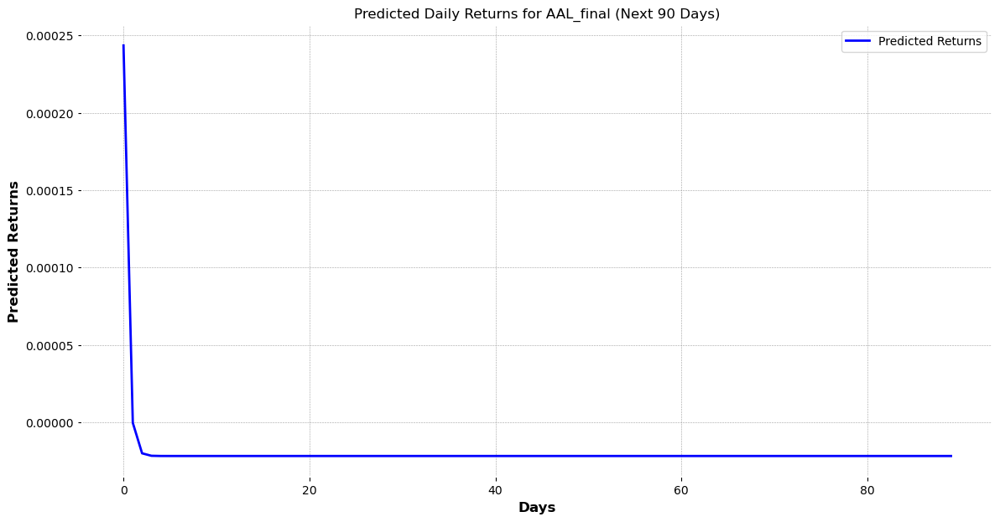

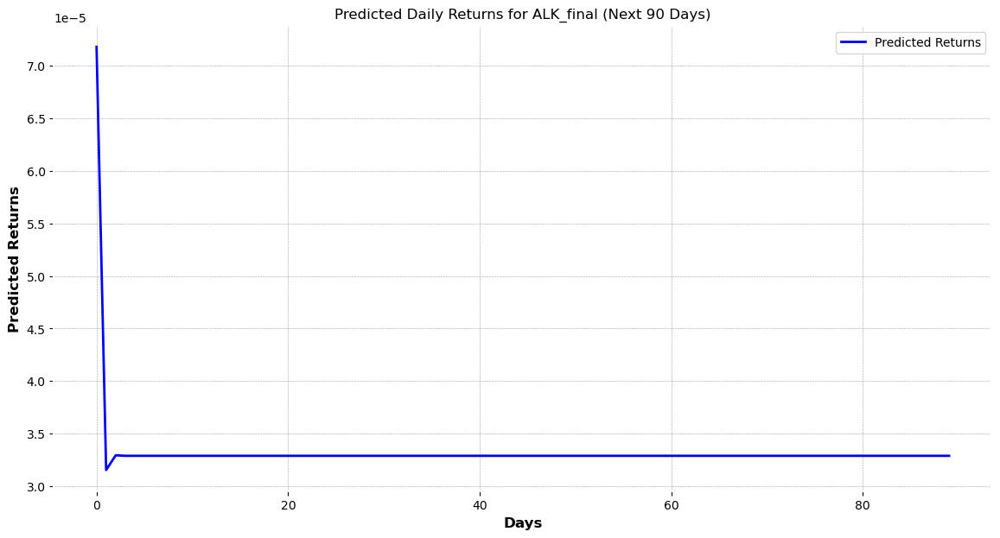

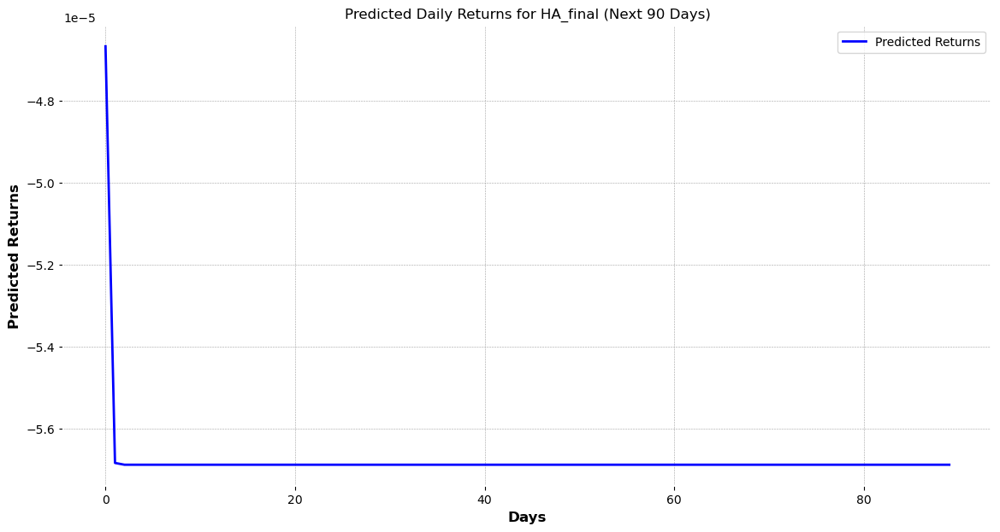

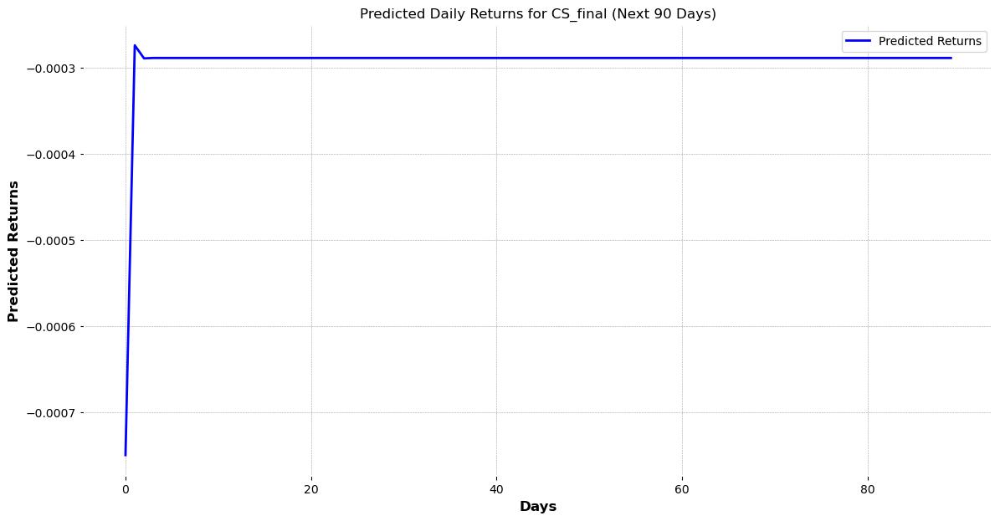

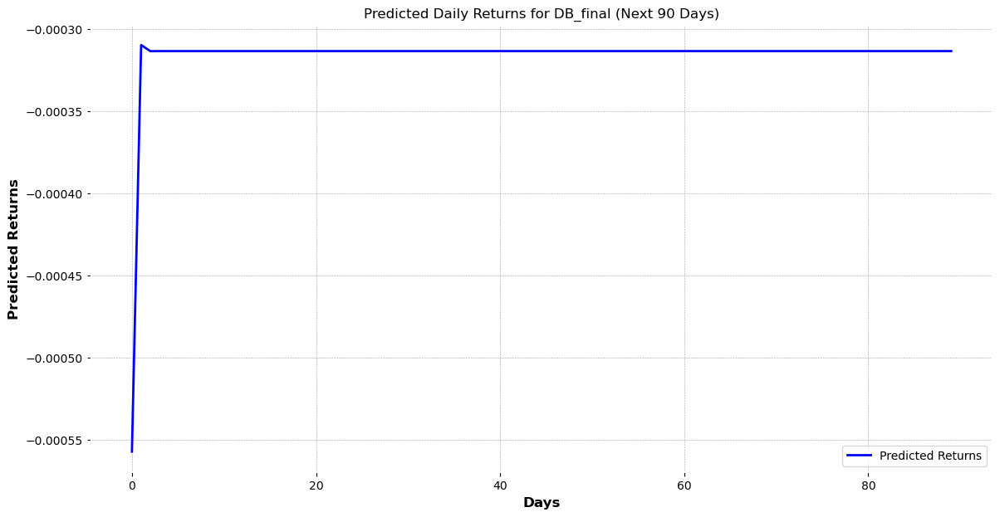

...

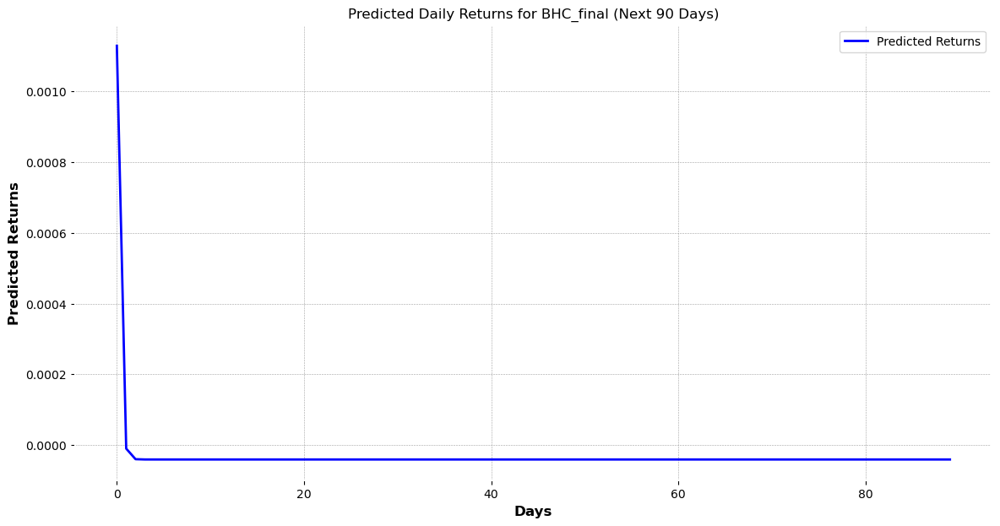

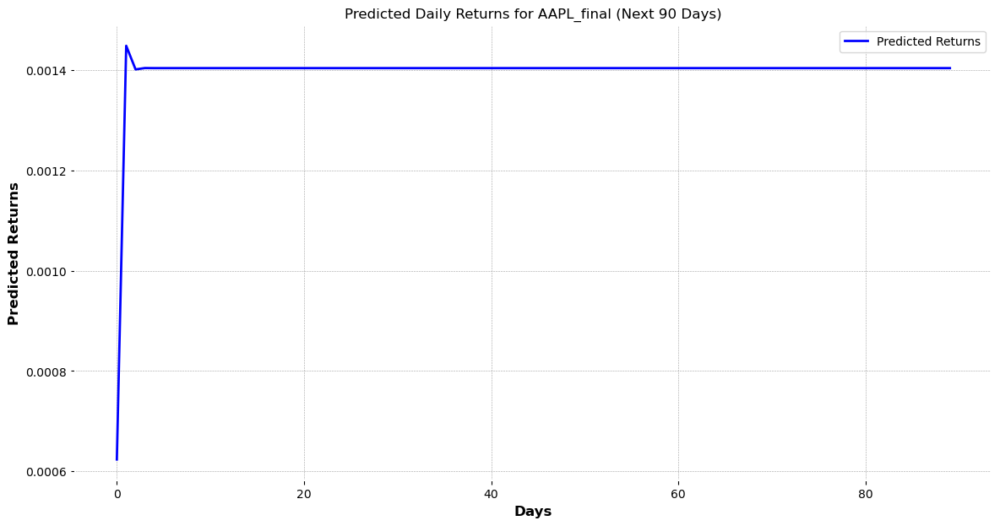

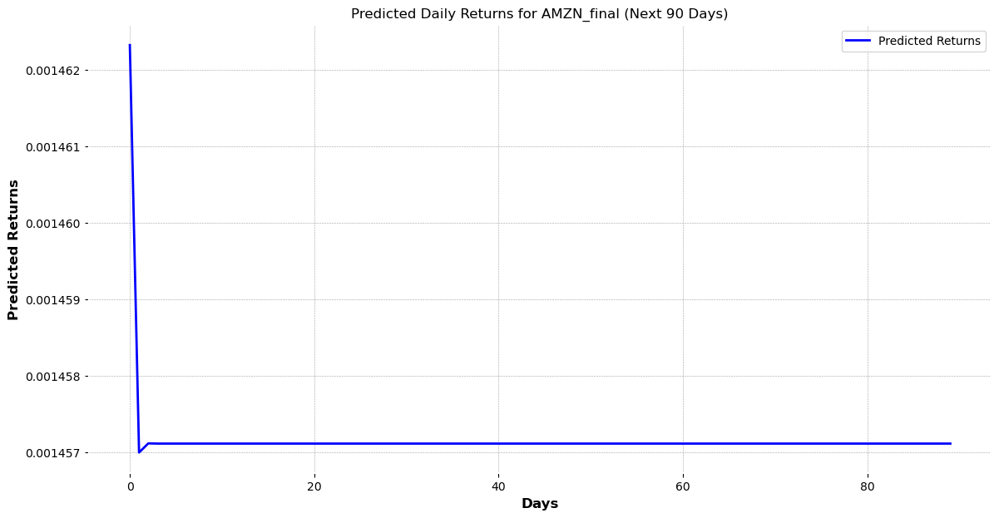

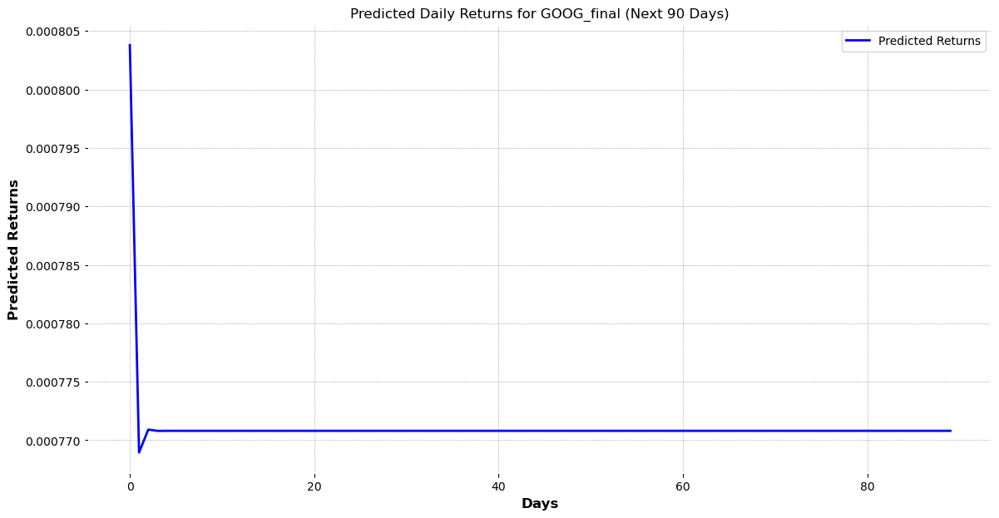

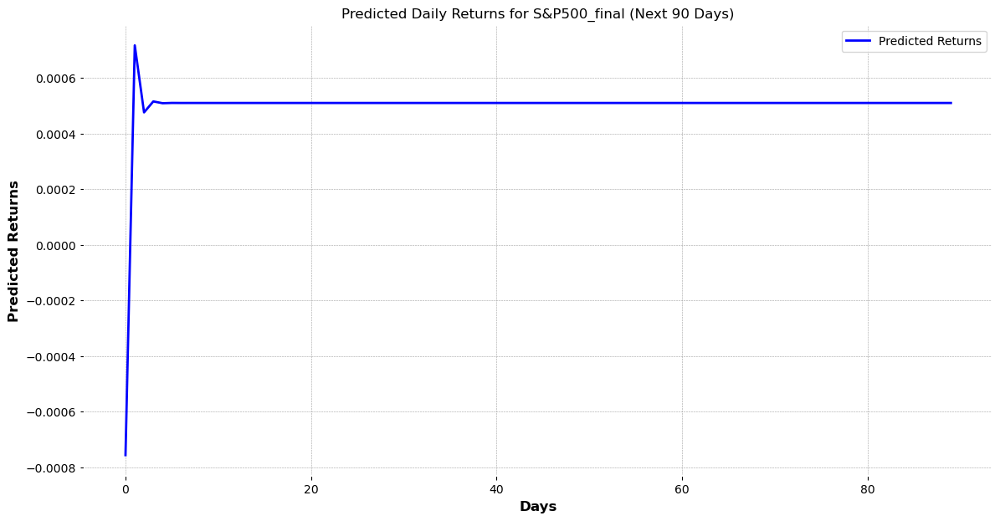

In [35]:


# Number of steps to forecast (e.g., 252 days for 1 year)
steps = 90

# Dictionary to store the forecast results
forecasts = {}

# Forecasting the future returns
for stock_name, model_fit in arima_models.items():
    try:
        # Generate forecast
        forecast = model_fit.get_forecast(steps=steps)
        forecast_values = forecast.predicted_mean

        # Store the forecast in the dictionary
        forecasts[stock_name] = forecast_values

        # Plotting the forecast
        plt.figure(figsize=(14, 7))
        plt.plot(np.arange(steps), forecast_values, label='Predicted Returns', color='blue')
        plt.title(f'Predicted Daily Returns for {stock_name} (Next 90 Days)')
        plt.xlabel('Days')
        plt.ylabel('Predicted Returns')
        plt.legend()
        plt.show()

    except Exception as e:
        print(f"Error forecasting for {stock_name}: {e}")




--------

#### Step 8: Portfolio Construction and Validation
1.	Portfolio Optimization: Construct an optimal portfolio using techniques like Mean-Variance Optimization.
2.	Backtesting: Backtest the portfolio to check its performance over the historical period.
3.	Validation: Validate if the portfolio meets Alexandra's financial goals.

In [38]:


#  We have selected three stocks: JNJ_final, MRK_final, AMZN_final
selected_stocks = ['JNJ_final', 'MRK_final', 'AMZN_final']

# Extract the daily returns for the selected stocks
returns = pd.DataFrame({stock: stocks[stock]['Daily_Return'] for stock in selected_stocks})

# Calculate the mean returns and covariance matrix
mean_returns = returns.mean()
cov_matrix = returns.cov()

# Function to calculate portfolio return
def portfolio_return(weights):
    return np.sum(mean_returns * weights) * 252

# Function to calculate portfolio volatility
def portfolio_volatility(weights):
    return np.sqrt(np.dot(weights.T, np.dot(cov_matrix * 252, weights)))

# Objective function to minimize (negative Sharpe Ratio)
def negative_sharpe_ratio(weights, risk_free_rate=0.0075):
    p_ret = portfolio_return(weights)
    p_vol = portfolio_volatility(weights)
    return -(p_ret - risk_free_rate) / p_vol

# Constraints: Sum of weights = 1
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

# Bounds for weights (0 to 1)
bounds = tuple((0, 1) for _ in range(len(selected_stocks)))

# Initial guess (equal distribution)
initial_guess = len(selected_stocks) * [1. / len(selected_stocks)]

# Perform optimization to find optimal weights
optimal_result = sco.minimize(negative_sharpe_ratio, initial_guess, method='SLSQP', bounds=bounds, constraints=constraints)
optimal_weights = optimal_result.x

# Display the optimal weights
optimal_portfolio = pd.DataFrame(optimal_weights, index=selected_stocks, columns=['Weight'])
print("Optimal Portfolio Weights:")
print(optimal_portfolio)


Optimal Portfolio Weights:
              Weight
JNJ_final   0.226139
MRK_final   0.087705
AMZN_final  0.686156


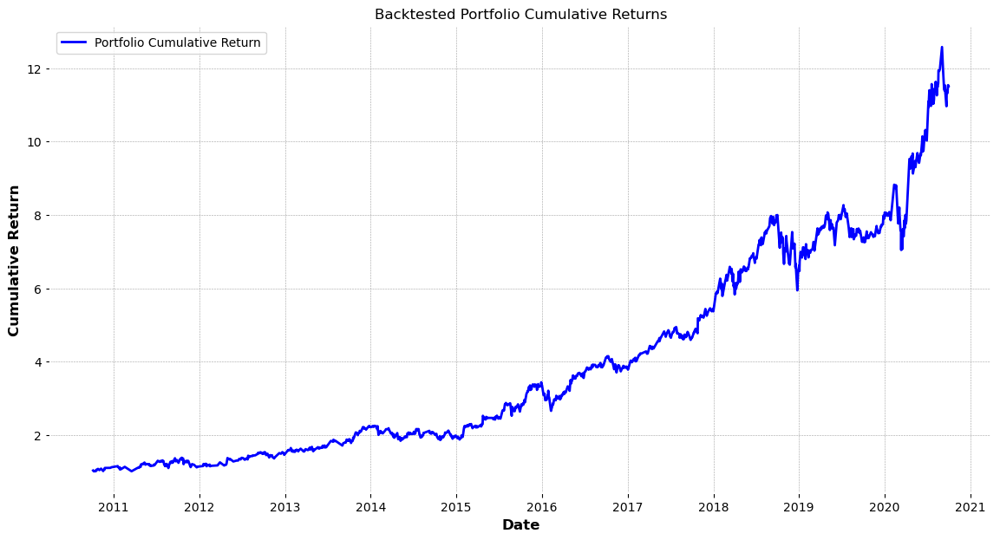

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Ensure the index and cumulative return series are numpy arrays
index_array = np.array(returns.index)
cumulative_return_array = np.array(returns['Cumulative_Return'])

plt.figure(figsize=(14, 7))
plt.plot(index_array, cumulative_return_array, label='Portfolio Cumulative Return', color='blue')
plt.title('Backtested Portfolio Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.show()


In [41]:
# Calculate the annualized return and volatility of the portfolio
portfolio_annualized_return = portfolio_return(optimal_weights)
portfolio_annualized_volatility = portfolio_volatility(optimal_weights)

# Calculate the portfolio's Sharpe Ratio
risk_free_rate = 0.0075  # 0.75%
portfolio_sharpe_ratio = (portfolio_annualized_return - risk_free_rate) / portfolio_annualized_volatility

print(f"Portfolio Annualized Return: {portfolio_annualized_return:.4f}")
print(f"Portfolio Annualized Volatility: {portfolio_annualized_volatility:.4f}")
print(f"Portfolio Sharpe Ratio: {portfolio_sharpe_ratio:.4f}")


Portfolio Annualized Return: 0.2638
Portfolio Annualized Volatility: 0.2349
Portfolio Sharpe Ratio: 1.0909
